## CMPINF 2100 Final Project

*You will submit a MAIN notebook which includes the short introduction to your topic, the key EDA visualizations, the key cluster visualizations, and the major modeling results and visualizations.* 

### A. Introduction (5 points)
*It is recommended that you complete the introduction after you have finished all the other parts.*

1. State whether you solved your project as a regression or classification problem.
    * this is a classification problem.
2. The general proposal comments including instructions for how to convert a regression problem to a classification problem if that is what you are interested in working on.
    * I converted this into a classification problem by setting the `binary_outcome` variable to be `== 0` if a song's `track_popularity` is `<40` and `== 1` if it is `>40`.
3. Describe the major findings you have identified based on your analysis.
    * From my analysis, the models really struggled to predict the outcome. It seems like the lack of correlation between continuous variables and the amount of continuous variables could have played a role. Even when controlling for the less significant variables, the models only achieved around a 60% Accuracy score.
4. Which inputs/features seem to influence the response/outcome the most?
    * The inputs that seemed to influence the outcome the most were `liveness`, `release_month`, and `key`.
5. What supported your conclusion? Was it only through predictive models?
    * I came to this conclusion of the important inputs after looking at the significant coefficients from the top performing models which had the largest magnitude.
6. Could EDA help identify similar trends/relationships?
    * Based on my EDA, I would have thought that `playlist_genre` and `bin_year` were two very important predictors of outcome based on their point plots.
7. Was clustering consistent with any conclusions from the predictive models?
    * Yes, because both had issues correctly identifying the outcome based on features.
8. What skills did you learn from going through this project?
    * Taking examples from class and applying them to a real data set, defining functions, and troubleshooting errors.
9. This is not related to application or project inputs/outputs directly. What general skills can you take away from the project to apply to applications more specific to your area of interest?
    * Time management is a big one. I underestimated the amount of time and effort that this would take to go from raw data through to modeling.
    * Making sure to go back and restart the kernel and run all cells to check if my workflow was correct. In my accessory notebooks, I thought I had done that, but when transferring over some code it caused errors.

### B. EDA (10 points)
* In the main report, you must include useful visualizations that represent:
  * Counts of categorical variables
  * Distributions of continuous variables
  * Relationships between continuous variables
  * Summaries of the continuous variables grouped by categorical variables
    * Consider visualizing relationships between continuous inputs using scatter plots, pair plots, joint density plots, and correlation plots.
  * **If you are working on a classification problem:** Visualize histograms and relationships between continuous inputs broken up by the outcome unique values. Count the number of observations for each combination of outcome unique value and the categorical input unique values. Use ROC curves or precision-recall curves to assess the performance of classification models, alongside confusion matrices.
* Reporting:
  * In the main report you must include what you feel are the most important figures to describe the behavior in your data.
    * The pairs and corr plots show little to no correlation with any of the continuous variables and `track_popularity`
    * The `bin_year` heat map shows that there is a lot more recent songs versus older songs, but that they are fairly evenly distributed between `binary_outcome` 0 and 1.
    * The point plot of the long data faceted by `binary_outcome` shows significant differences in the averages for `danceability`, `energy`, `loudness`, `acousticness`, `instrumentalness`, `liveness`, `valence`, and `duration_ms`.
  * Avoid overcrowding your main report with unnecessary figures. Each figure should serve a clear purpose in supporting your analysis. Essentially, describe the important conclusions that should be drawn from that figure. The description does not have to be long. You should provide enough to detail to make it obvious you understand what the figure is showing. Thus, your main report does not need a full EDA—You already performed a full EDA with the proposal.
    * Notes included throughout and in EDA notebook.
  * Failure to draw inferences from the figures included in your main report may result in a penalty. Ensure that your discussion clearly reflects an understanding of what the figure indicates and its significance to your analysis.
    * Notes included throughout and in EDA notebook.
  * The supporting document for EDA can include many more figures. In this way, your support document can be your practice notebook where you try out different groupings and visualizations. You do not need to include discussion text in your support document. If you feel your proposal included all the figures you tried out, you may submit your proposal again as the supporting document. The supporting document allows you the opportunity to show you explored other options after receiving the proposal feedback. For example, you should visualize distributions of transformed variables as recommended in the proposal feedback.

## Import Modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns

## Read & Clean Data

*code copied over from EDA notebook*

In [2]:
songs_url = 'https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-01-21/spotify_songs.csv'

df = pd.read_csv( songs_url )

In [3]:
## change the mode and key variables to categoricals
df['mode'] = df['mode'].astype('category')
df['key'] = df.key.astype('category')

## Convert the date/time variables
df['track_album_release_date_dt'] = pd.to_datetime( df.track_album_release_date, format='mixed' )
df['release_year'] = df.track_album_release_date_dt.dt.year
df['release_month'] = df.track_album_release_date_dt.dt.month
df['release_month'] = df.release_month.astype('category')
df['bin_year'] = np.where( df.release_year < 2010, 'older', 'recent')

## drop duplicates from the dataframe and force a deep copy
df_copy = df.drop_duplicates(subset='track_id', keep='first').copy()

## modify track_popularity to be a binary categorical variable
df_copy['binary_outcome'] = np.where( df_copy.track_popularity > 40, 1, 0 )
df_copy['binary_outcome'] = df_copy.binary_outcome.astype('category')

In [4]:
print('Basic Information:')
print('Number of Rows:', df_copy.shape[0])
print('Number of Columns', df_copy.shape[1])

Basic Information:
Number of Rows: 28356
Number of Columns 28


In [5]:
## variable names and types
df_copy.dtypes

track_id                               object
track_name                             object
track_artist                           object
track_popularity                        int64
track_album_id                         object
track_album_name                       object
track_album_release_date               object
playlist_name                          object
playlist_id                            object
playlist_genre                         object
playlist_subgenre                      object
danceability                          float64
energy                                float64
key                                  category
loudness                              float64
mode                                 category
speechiness                           float64
acousticness                          float64
instrumentalness                      float64
liveness                              float64
valence                               float64
tempo                             

In [6]:
## missing values
df_copy.isna().sum()

track_id                       0
track_name                     4
track_artist                   4
track_popularity               0
track_album_id                 0
track_album_name               4
track_album_release_date       0
playlist_name                  0
playlist_id                    0
playlist_genre                 0
playlist_subgenre              0
danceability                   0
energy                         0
key                            0
loudness                       0
mode                           0
speechiness                    0
acousticness                   0
instrumentalness               0
liveness                       0
valence                        0
tempo                          0
duration_ms                    0
track_album_release_date_dt    0
release_year                   0
release_month                  0
bin_year                       0
binary_outcome                 0
dtype: int64

In [7]:
## unique values
df_copy.nunique()

track_id                       28356
track_name                     23449
track_artist                   10692
track_popularity                 101
track_album_id                 22545
track_album_name               19743
track_album_release_date        4530
playlist_name                    448
playlist_id                      470
playlist_genre                     6
playlist_subgenre                 24
danceability                     822
energy                           952
key                               12
loudness                       10222
mode                               2
speechiness                     1270
acousticness                    3731
instrumentalness                4729
liveness                        1624
valence                         1362
tempo                          17684
duration_ms                    19785
track_album_release_date_dt     4474
release_year                      63
release_month                     12
bin_year                           2
b

#### Counts of categorical variables

In [8]:
df_copy.drop(columns = ['track_id', 'track_name', 'track_artist', 'track_album_id', 'track_album_name', 'track_album_release_date','playlist_name','playlist_id','playlist_subgenre']).\
select_dtypes(['category','object']).info()

<class 'pandas.core.frame.DataFrame'>
Index: 28356 entries, 0 to 32832
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   playlist_genre  28356 non-null  object  
 1   key             28356 non-null  category
 2   mode            28356 non-null  category
 3   release_month   28356 non-null  category
 4   bin_year        28356 non-null  object  
 5   binary_outcome  28356 non-null  category
dtypes: category(4), object(2)
memory usage: 776.3+ KB


/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


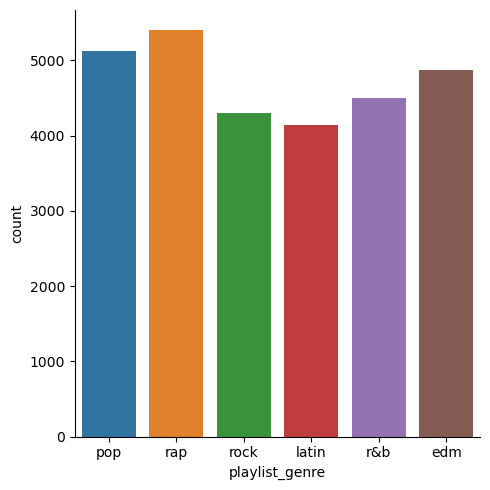

In [9]:
sns.catplot(data = df_copy, x = 'playlist_genre', kind = 'count',
           hue = 'playlist_genre')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


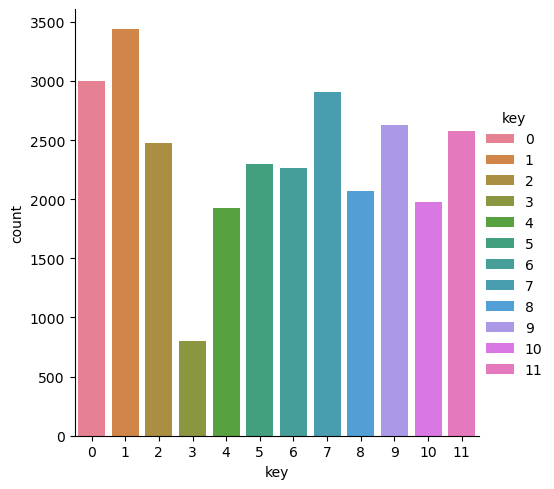

In [10]:
sns.catplot(data = df_copy, x = 'key', kind = 'count',
           hue = 'key')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


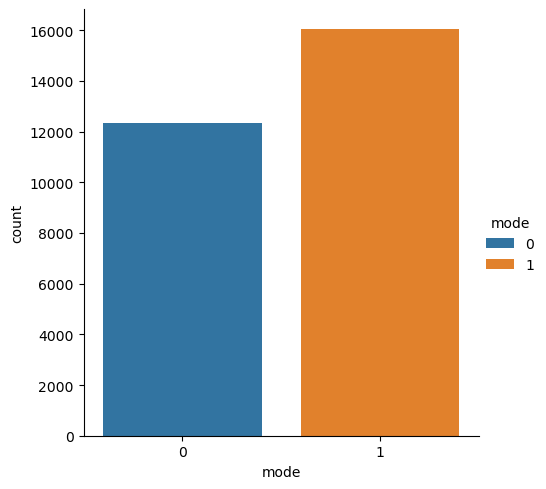

In [11]:
sns.catplot(data = df_copy, x = 'mode', kind = 'count',
           hue = 'mode')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


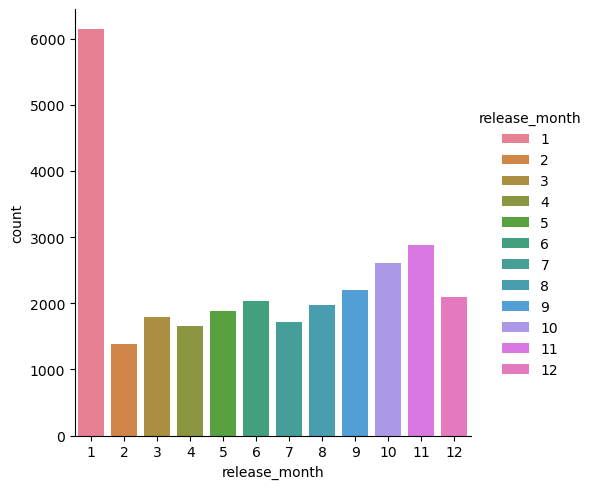

In [12]:
sns.catplot(data = df_copy, x = 'release_month', kind = 'count',
           hue = 'release_month')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


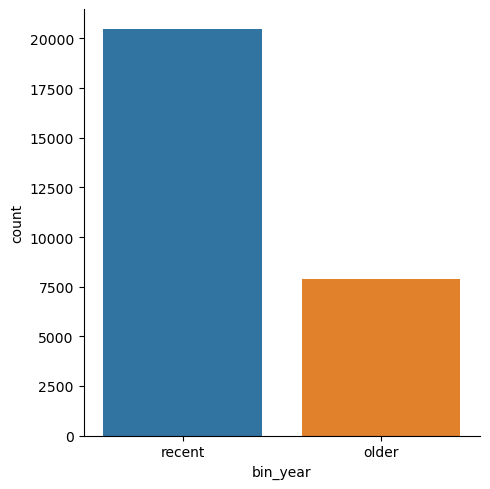

In [13]:
sns.catplot(data = df_copy, x = 'bin_year', kind = 'count',
           hue = 'bin_year')

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


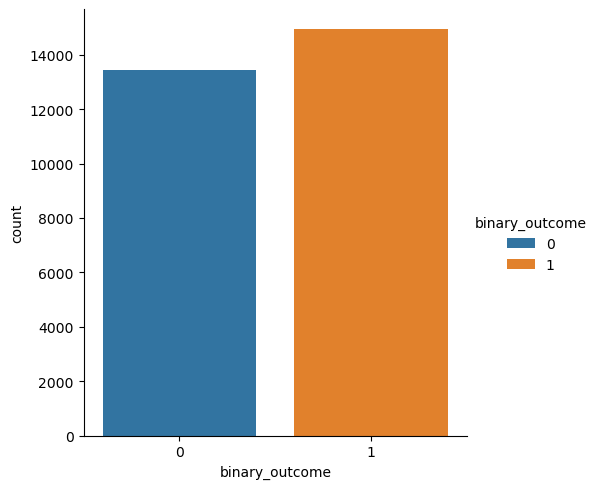

In [14]:
sns.catplot(data = df_copy, x = 'binary_outcome', kind = 'count',
           hue = 'binary_outcome')

plt.show()

Distributions are fairly spread out across categorical variables.

`key == 3` has less than the others but not by too significant a margin.

`release_month == 1` has a large count.

`bin_year == recent` has quite a few more songs.

`binary_outcome` was adjusted for in the EDA notebook, with a threshold of >40 to be categorized as popular or `binary_outcome == 1`.

#### Distributions of continuous variables

In [15]:
df_copy.drop(columns = ['track_popularity','release_year']).\
select_dtypes('number').info()

<class 'pandas.core.frame.DataFrame'>
Index: 28356 entries, 0 to 32832
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   danceability      28356 non-null  float64
 1   energy            28356 non-null  float64
 2   loudness          28356 non-null  float64
 3   speechiness       28356 non-null  float64
 4   acousticness      28356 non-null  float64
 5   instrumentalness  28356 non-null  float64
 6   liveness          28356 non-null  float64
 7   valence           28356 non-null  float64
 8   tempo             28356 non-null  float64
 9   duration_ms       28356 non-null  int64  
dtypes: float64(9), int64(1)
memory usage: 2.4 MB


/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


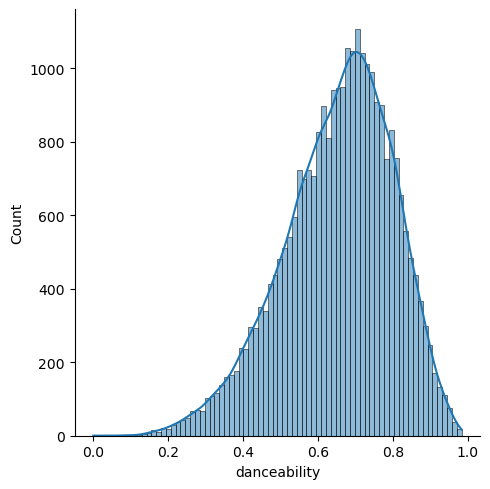

In [16]:
sns.displot(data=df_copy, x='danceability', kde=True)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


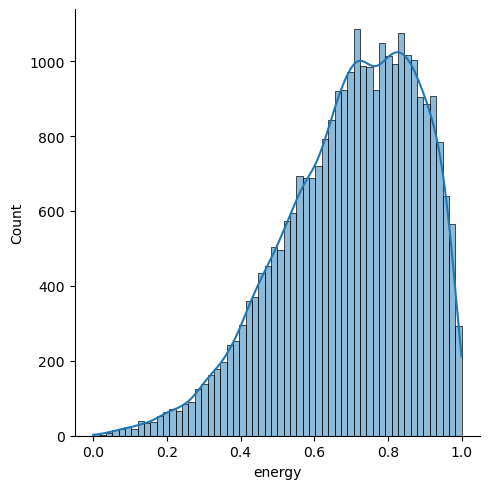

In [17]:
sns.displot(data=df_copy, x='energy', kde=True)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


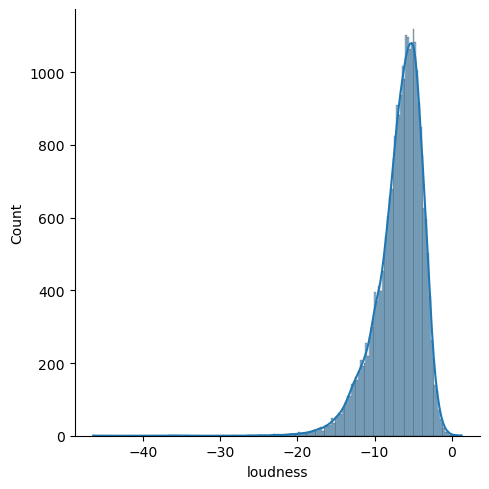

In [18]:
sns.displot(data=df_copy, x='loudness', kde=True)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


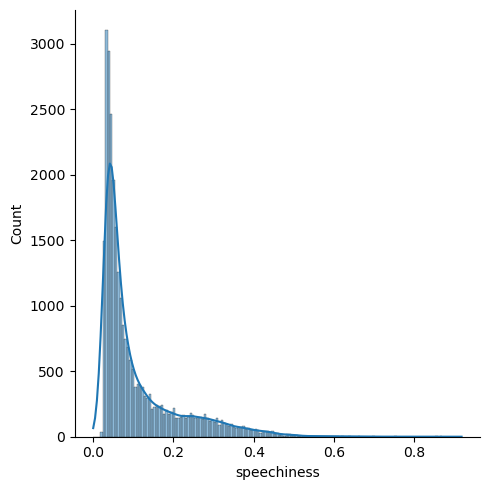

In [19]:
sns.displot(data=df_copy, x='speechiness', kde=True)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


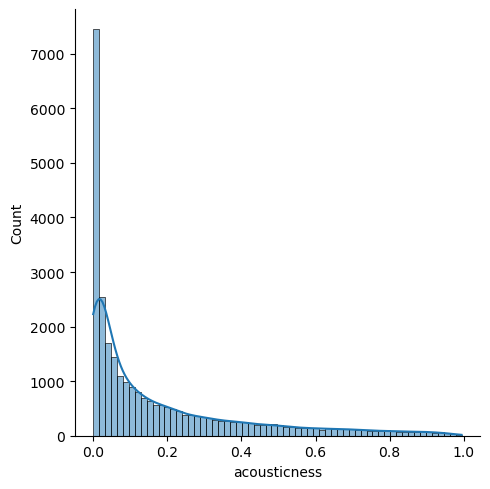

In [20]:
sns.displot(data=df_copy, x='acousticness', kde=True)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


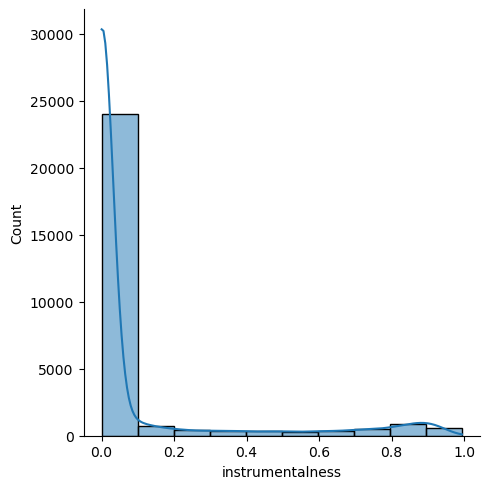

In [21]:
sns.displot(data=df_copy, x='instrumentalness', kind='hist', bins=10, kde=True)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


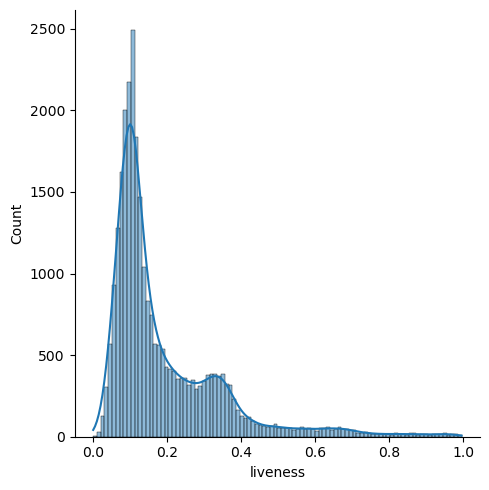

In [22]:
sns.displot(data=df_copy, x='liveness', kde=True)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


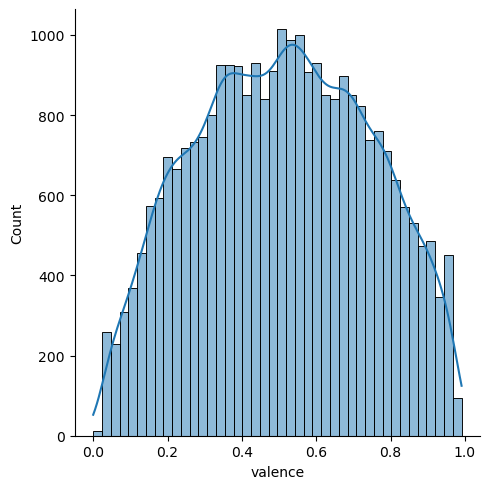

In [23]:
sns.displot(data=df_copy, x='valence', kde=True)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


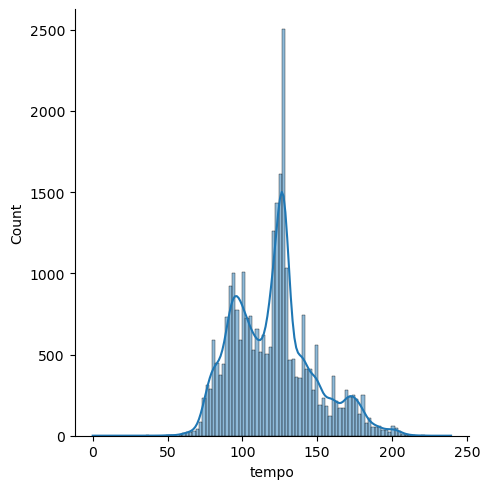

In [24]:
sns.displot(data=df_copy, x='tempo', kde=True)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


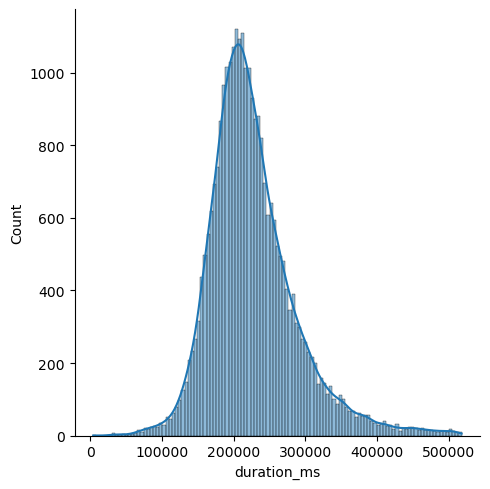

In [25]:
sns.displot(data=df_copy, x='duration_ms', kde=True)

plt.show()

`danceability` - Most values are around 0.7.

`energy` - Most values between 0.7 and 0.9.

`speechiness` - Most songs do not have high `speechiness` values which indicates that they are musical tracks - the higher values here probably represent rap/hip-hop songs. 

`loudness` - Most songs have slightly negative loudness values.

`acousticness` - Most songs are not confidently acoustic.

`instrumentalness` - The vast majority of songs contain vocals, making the values highly concentrated around 0.

`liveness` - Nearly all songs are below 0.8, meaning they are not live/no audience can be heard.

`valence` - Most songs have a `valence` or happiness factor between 0.3 and 0.8.

`tempo` - Tracks have highly concentrated tempos around 100 and 125 bpm.

`duration_ms` - Most songs are around 200000 ms or 3.33 min.

#### Relationships between continuous variables

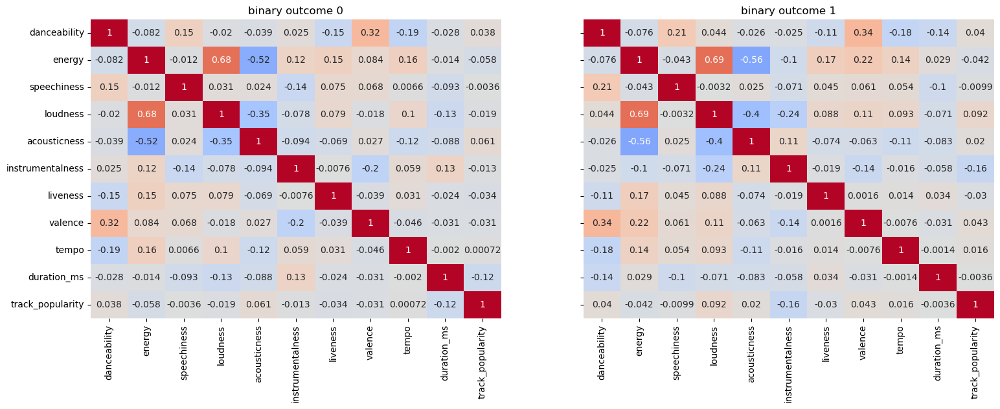

In [26]:
## create a list of the continuous variables
continuous_variable_list = ['danceability', 'energy', 'speechiness', 'loudness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'track_popularity']

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

sns.heatmap(data = df_copy.loc[df_copy.binary_outcome == 0, continuous_variable_list].corr(),
            vmin=-1, vmax=1, center=0,
            cmap='coolwarm', cbar=False,
            annot=True, annot_kws={'size':10},
            ax=axes[0])
axes[0].set_title('binary outcome 0')

sns.heatmap(data = df_copy.loc[df_copy.binary_outcome == 1, continuous_variable_list].corr(),
            vmin=-1, vmax=1, center=0,
            cmap='coolwarm', cbar=False,
            annot=True, annot_kws={'size':10},
            ax=axes[1])
axes[1].set_title('binary outcome 1')


plt.show()

For both binary_outcome values, there is a positive correlation between loudness and energy and a a negative correlation between acousticness and energy. There are no strong positive or negative correlations between track_popularity and any continuous variable.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


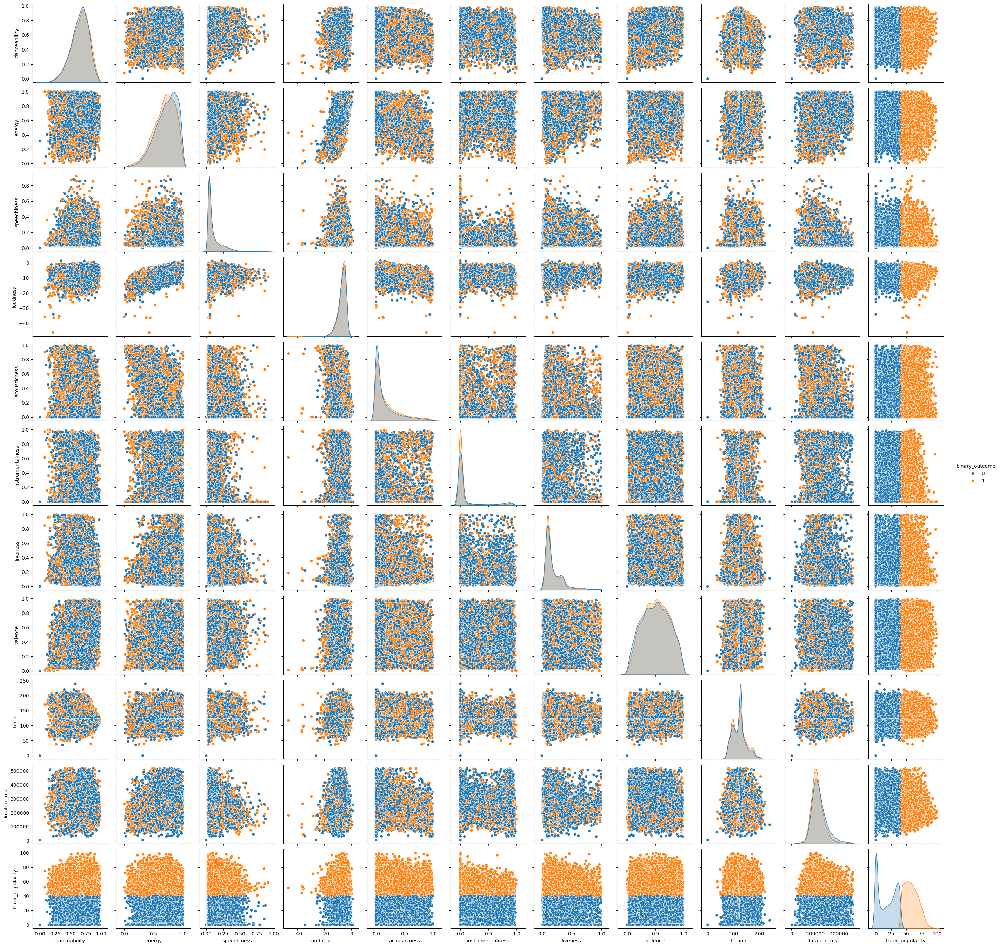

In [27]:
sns.pairplot(data = df_copy, x_vars = ['danceability', 'energy', 'speechiness', 'loudness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'track_popularity'],
             y_vars = ['danceability', 'energy', 'speechiness', 'loudness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'track_popularity'],
             diag_kws={'common_norm': False},
            hue='binary_outcome')

plt.show()

As shown by the correlation and pairs plot, there are no distinguishable relationships between continuous variables.

#### Summaries of the continuous variables grouped by categorical variables

In [28]:
## modify data to long-format
df_copy_long = df_copy.reset_index().rename(columns={'index':'row_id'}).\
melt(id_vars = ['row_id', 'playlist_genre', 'key', 'mode', 'release_year', 'release_month', 'binary_outcome', 'bin_year'],
     value_vars = ['danceability', 'energy', 'speechiness', 'loudness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'track_popularity'])

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


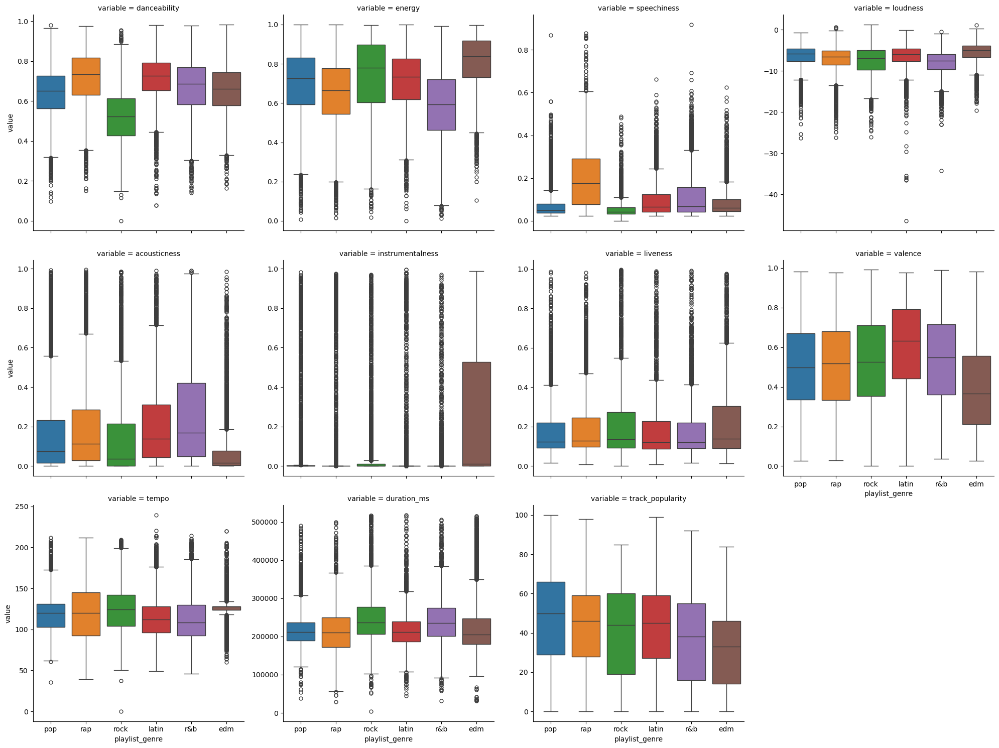

In [29]:
## grouped by playlist_genre
sns.catplot(data=df_copy_long, x='playlist_genre', y='value', col='variable',
           kind='box', hue='playlist_genre', sharey=False,
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


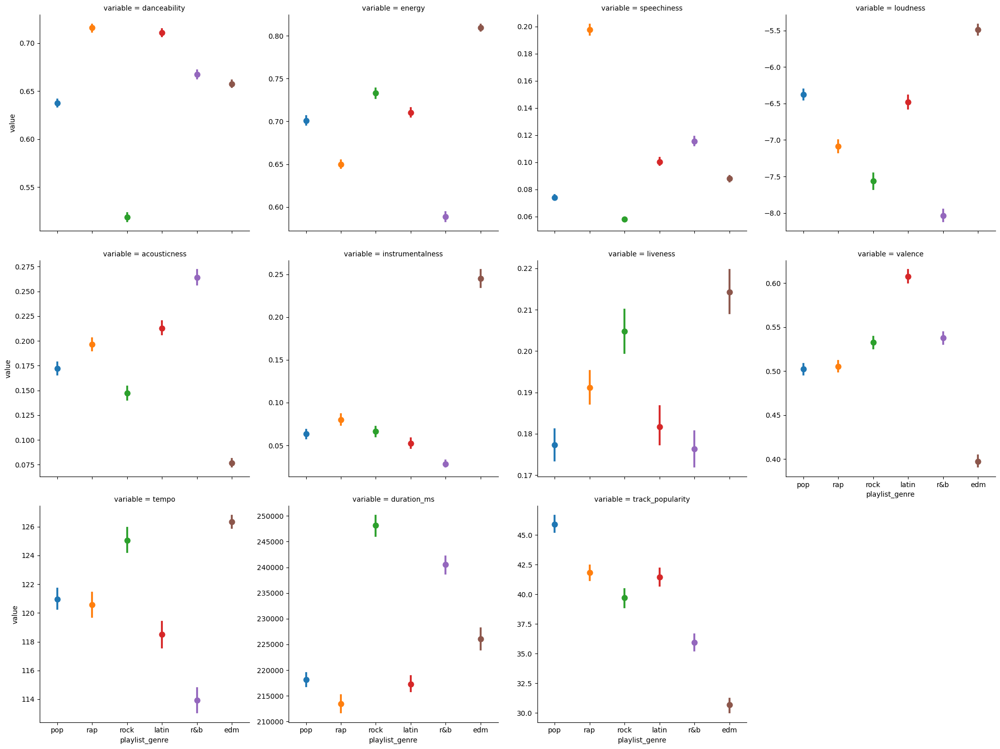

In [30]:
sns.catplot(data=df_copy_long, x='playlist_genre', y='value', col='variable',
           kind='point', hue='playlist_genre', sharey=False,
           col_wrap=4)

plt.show()

The different genres are noticeably different across the continuous variables - including `track_popularity`. Interested to see if this becomes a statistically significant variable in modeling.

Continuous variables grouped by `key`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


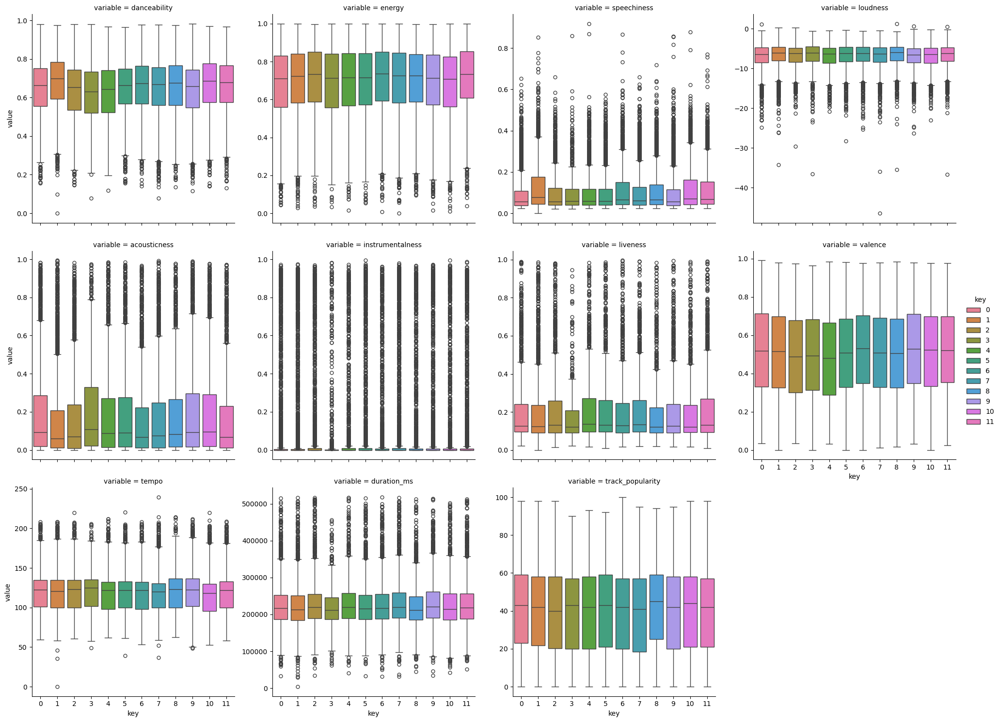

In [31]:
sns.catplot(data=df_copy_long, x='key', y='value', col='variable',
           kind='box', hue='key', sharey=False,
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


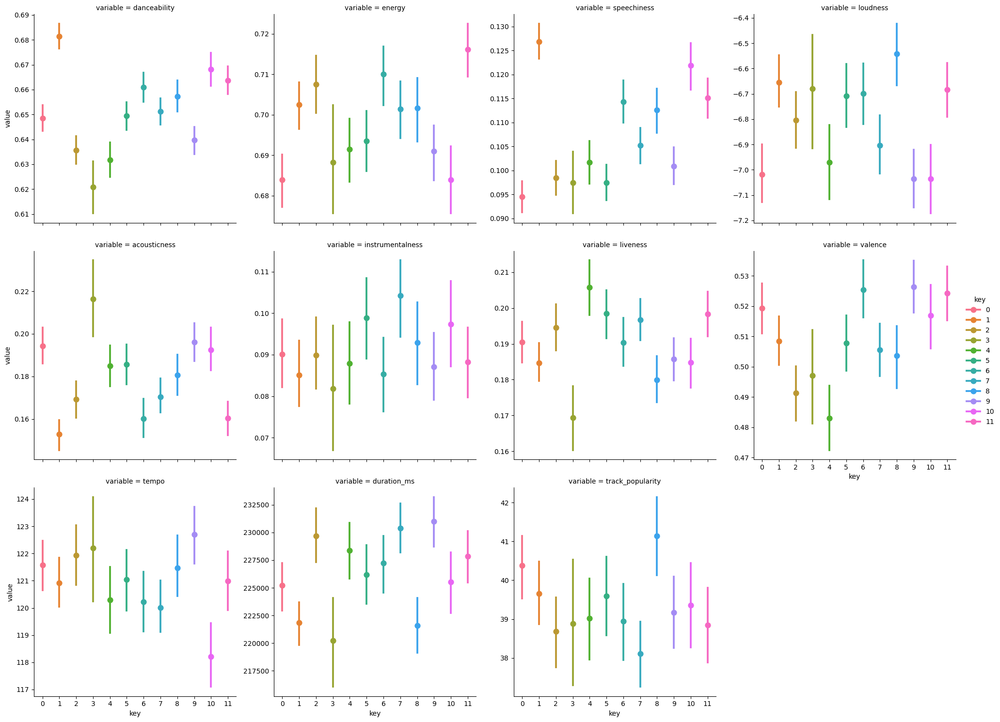

In [32]:
sns.catplot(data=df_copy_long, x='key', y='value', col='variable',
           kind='point', hue='key', sharey=False,
           col_wrap=4)

plt.show()

When grouped by `key`, there are differences between continuous variables. It looks like `key` 8 is almost statistically more popular than the others.

Continuous variables grouped by `mode`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


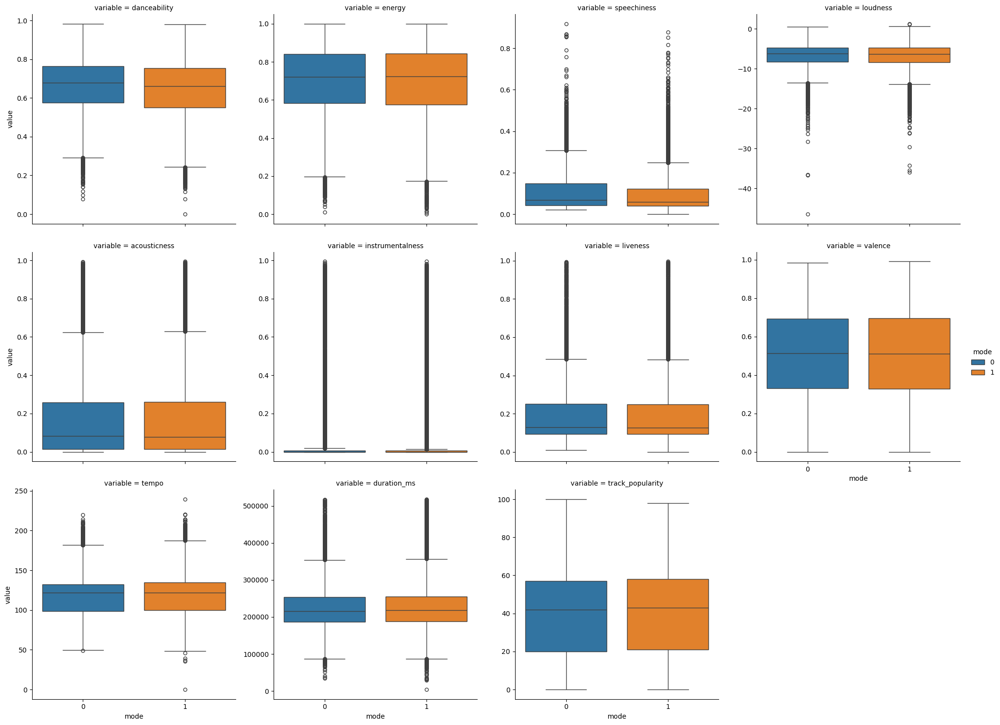

In [33]:
sns.catplot(data=df_copy_long, x='mode', y='value', col='variable',
           kind='box', hue='mode', sharey=False,
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


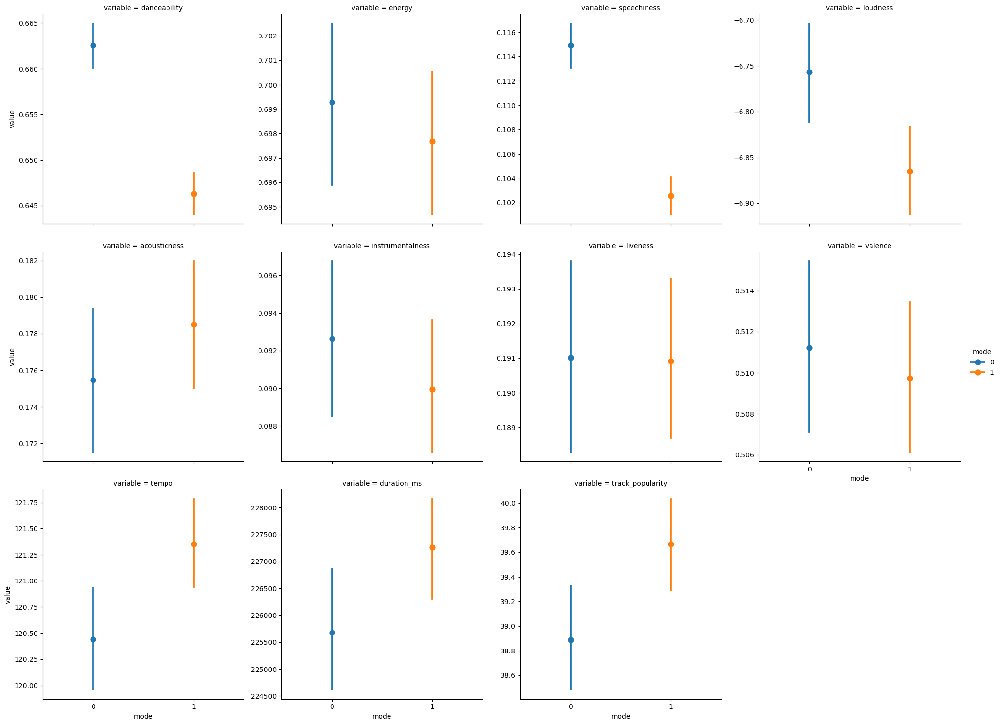

In [34]:
sns.catplot(data=df_copy_long, x='mode', y='value', col='variable',
           kind='point', hue='mode', sharey=False,
           col_wrap=4)

plt.show()

`mode` does not seem to have influence on other continuous variables.

Continuous variables grouped by `release_month`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


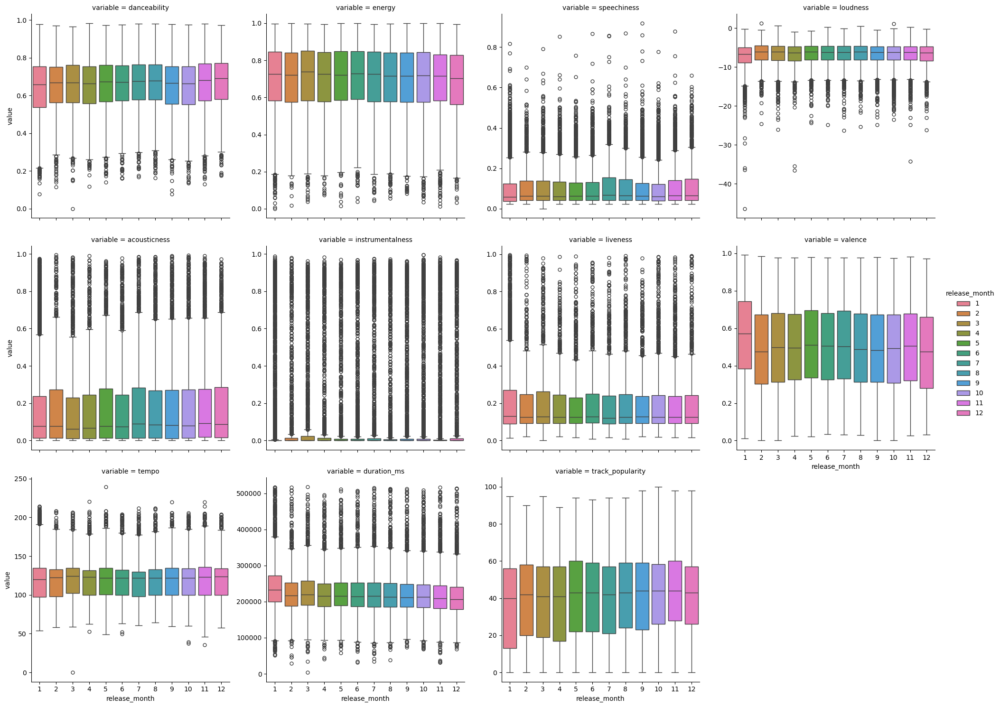

In [35]:
sns.catplot(data=df_copy_long, x='release_month', y='value', col='variable',
           kind='box', hue='release_month', sharey=False,
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


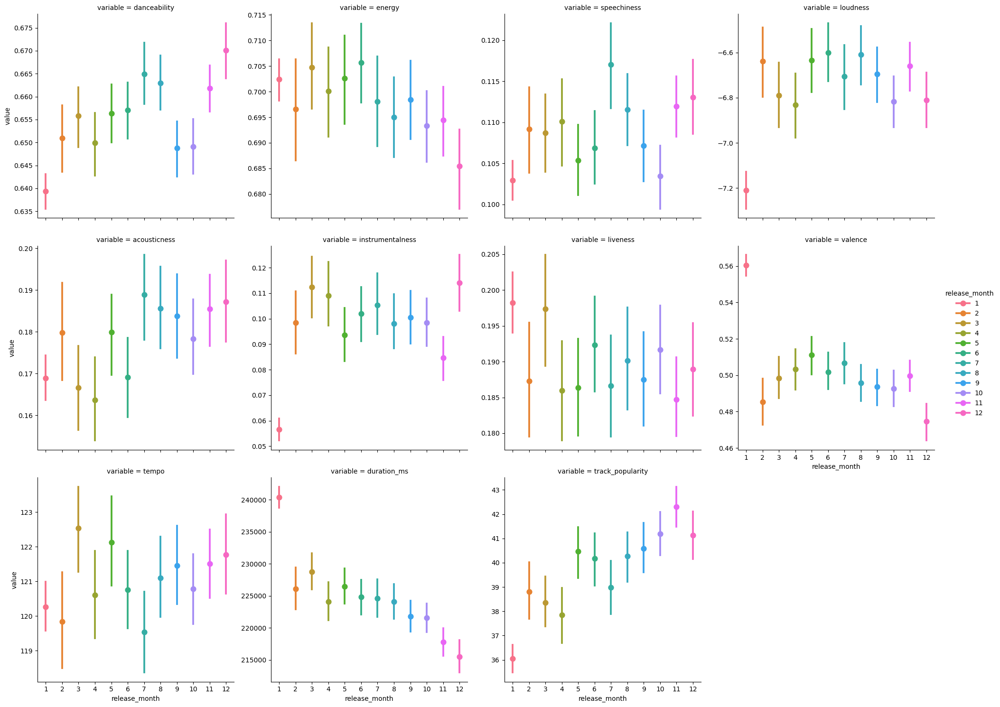

In [36]:
sns.catplot(data=df_copy_long, x='release_month', y='value', col='variable',
           kind='point', hue='release_month', sharey=False,
           col_wrap=4)

plt.show()

Looks like songs in January are different on average from other months but less popular.

Continuous variables grouped by `binary_outcome`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


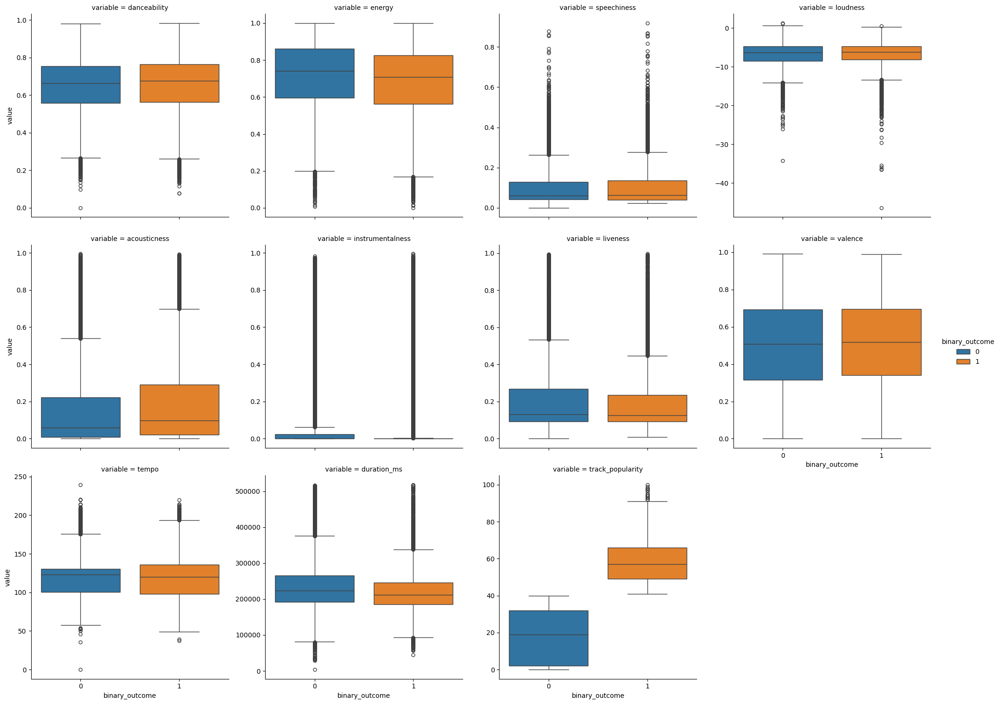

In [37]:
sns.catplot(data=df_copy_long, x='binary_outcome', y='value', col='variable',
           kind='box', hue='binary_outcome', sharey=False,
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


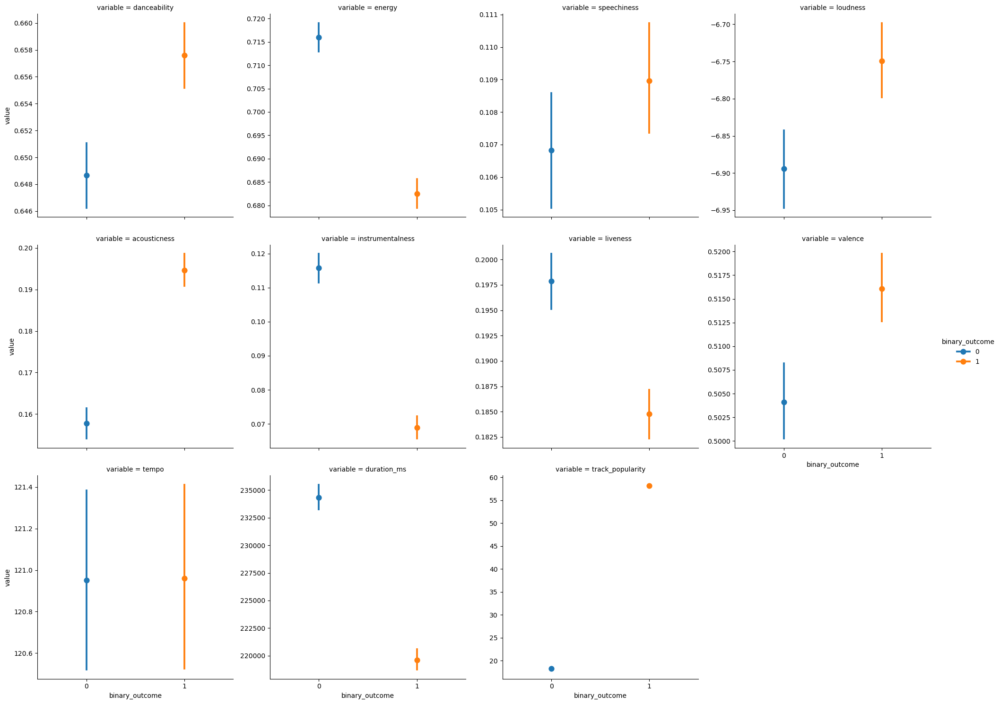

In [38]:
sns.catplot(data=df_copy_long, x='binary_outcome', y='value', col='variable',
           kind='point', hue='binary_outcome', sharey=False,
           col_wrap=4)

plt.show()

Based on `binary_outcome` - we can see clear differences on average of most continuous variables.

Continuous variables grouped by `bin_year`

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


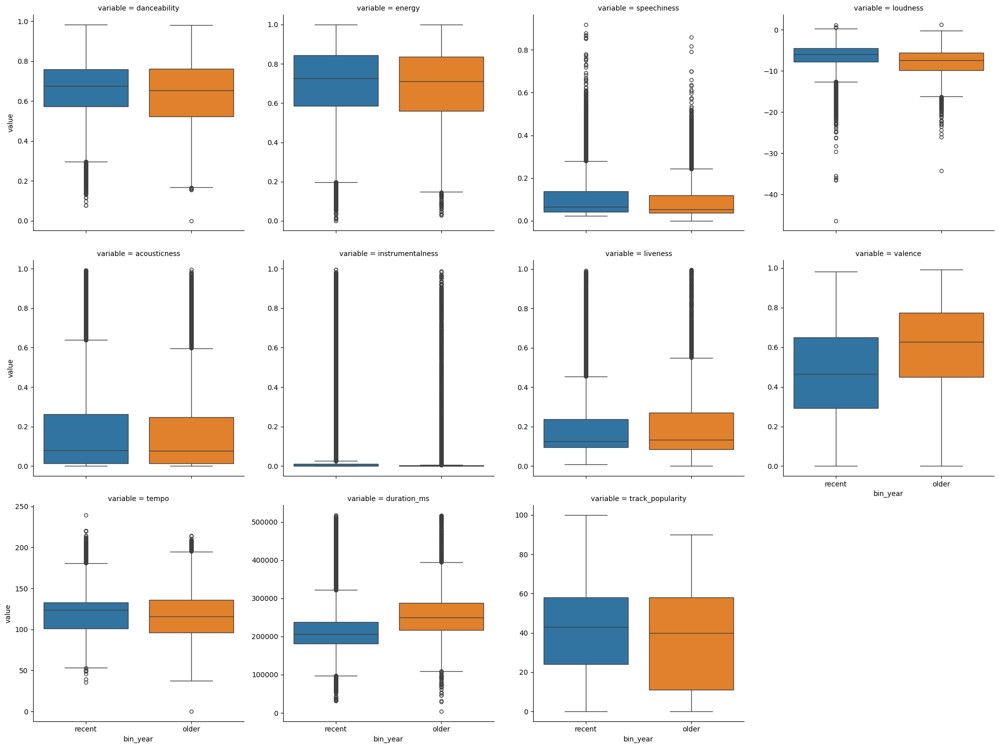

In [39]:
sns.catplot(data=df_copy_long, x='bin_year', y='value', col='variable',
           kind='box', hue='bin_year', sharey=False,
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


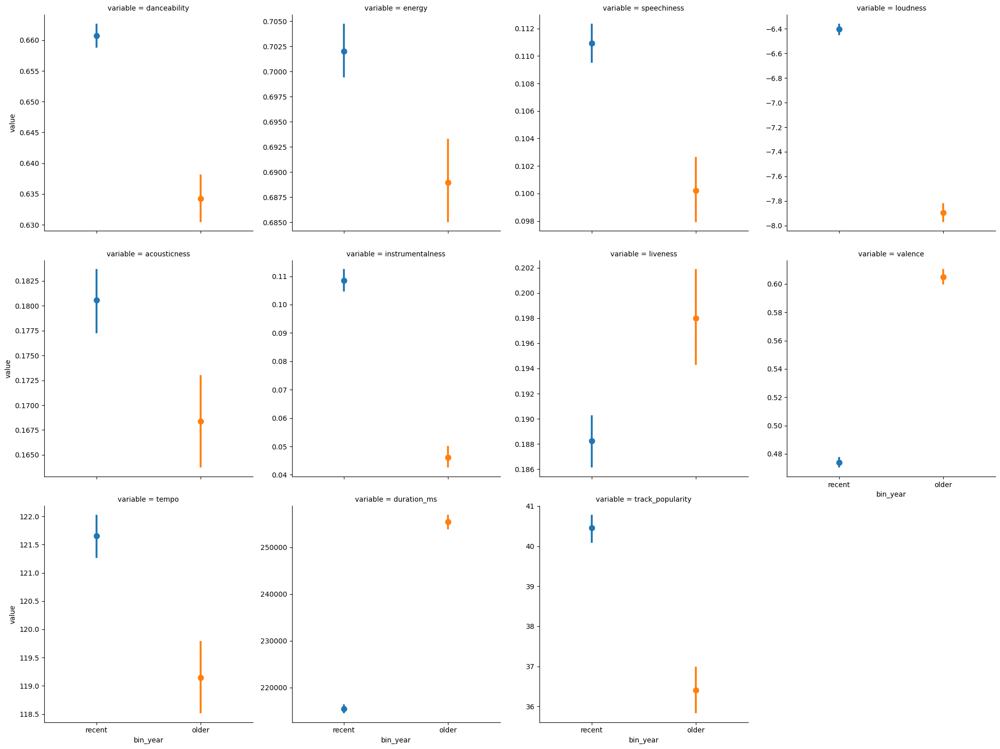

In [40]:
sns.catplot(data=df_copy_long, x='bin_year', y='value', col='variable',
           kind='point', hue='bin_year', sharey=False,
           col_wrap=4)

plt.show()

On average, there are clear differences across continuous variables when looking at `bin_year`

#### If you are working on a classification problem: 

Visualize histograms and relationships between continuous inputs broken up by the outcome unique values. Count the number of observations for each combination of outcome unique value and the categorical input unique values. Use ROC curves or precision-recall curves to assess the performance of classification models, alongside confusion matrices.
* Histograms of each continuous variable faceted by the categorical output values are below.
* Below the histograms are visual representations of the counts for each combination of outcome unique value and categorical input unique values.
* The relationships between the continuous inputs per unique output value are above in the corrplot and pairs plot.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


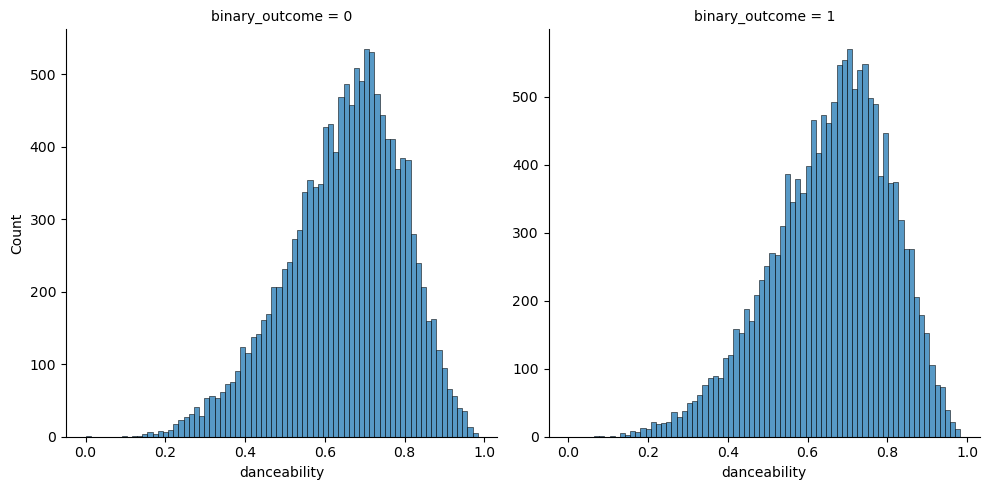

In [41]:
sns.displot(data=df_copy, x='danceability', kind='hist', col='binary_outcome',
           facet_kws={'sharey':False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


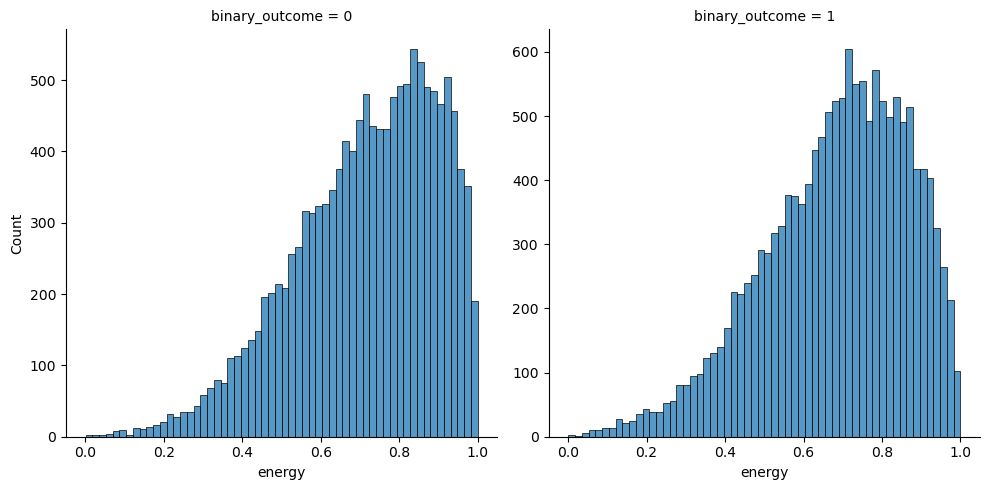

In [42]:
sns.displot(data=df_copy, x='energy', kind='hist', col='binary_outcome',
           facet_kws={'sharey':False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


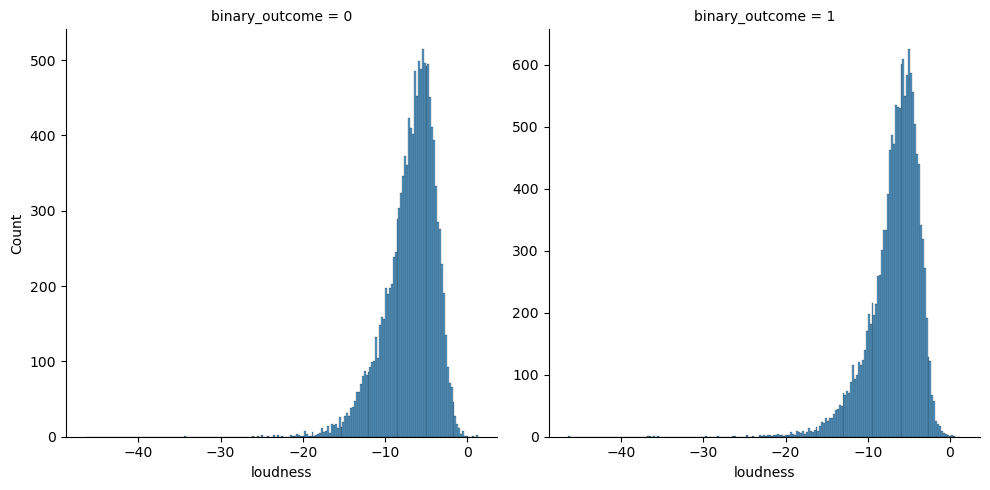

In [43]:
sns.displot(data=df_copy, x='loudness', kind='hist', col='binary_outcome',
           facet_kws={'sharey':False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


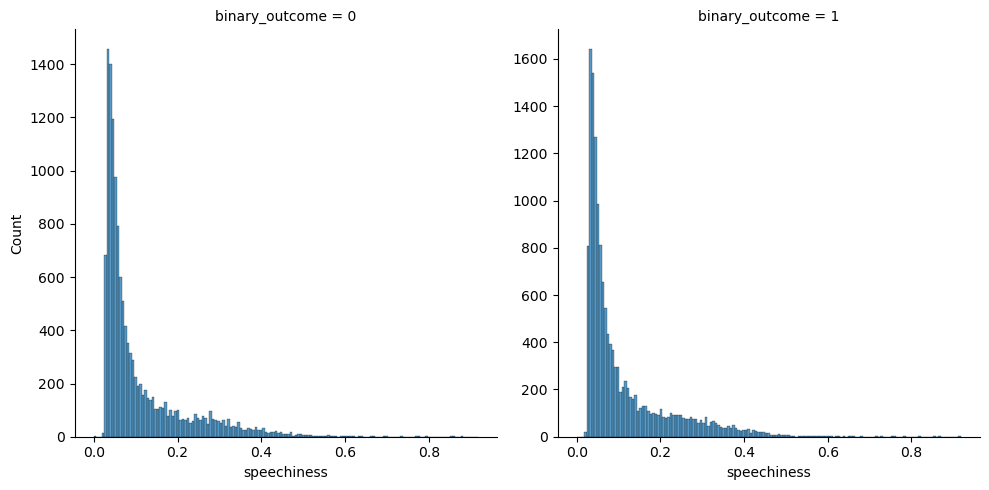

In [44]:
sns.displot(data=df_copy, x='speechiness', kind='hist', col='binary_outcome',
           facet_kws={'sharey':False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


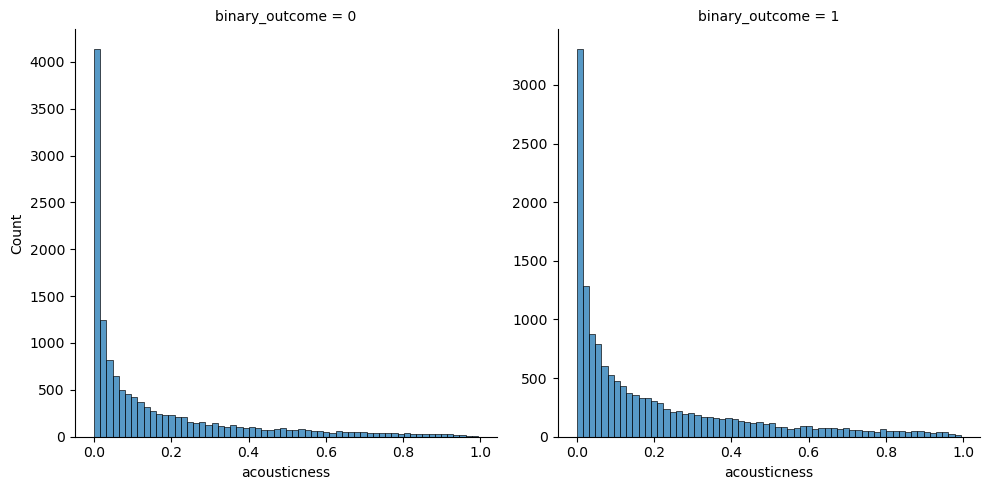

In [45]:
sns.displot(data=df_copy, x='acousticness', kind='hist', col='binary_outcome',
           facet_kws={'sharey':False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


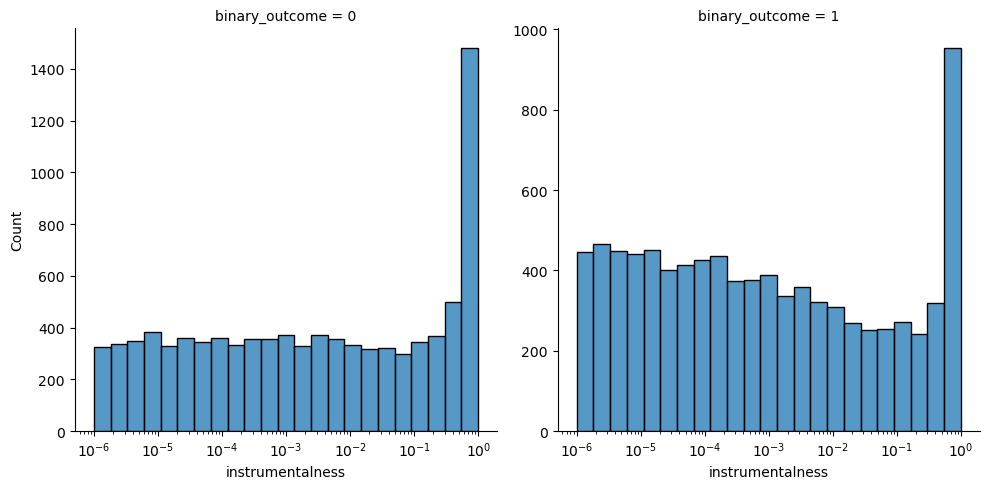

In [46]:
sns.displot(data=df_copy, x='instrumentalness', kind='hist', col='binary_outcome', 
            log_scale=(True, False), facet_kws={'sharey':False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


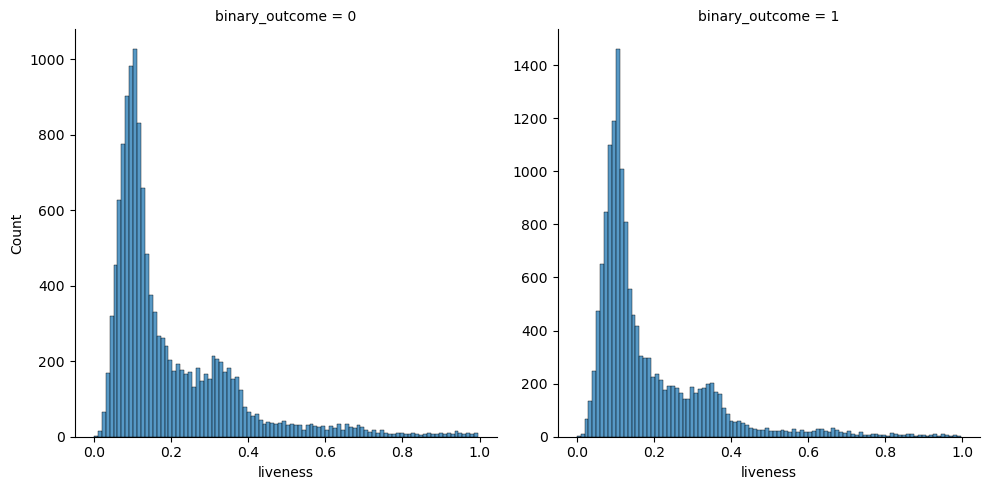

In [47]:
sns.displot(data=df_copy, x='liveness', kind='hist', col='binary_outcome',
           facet_kws={'sharey':False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


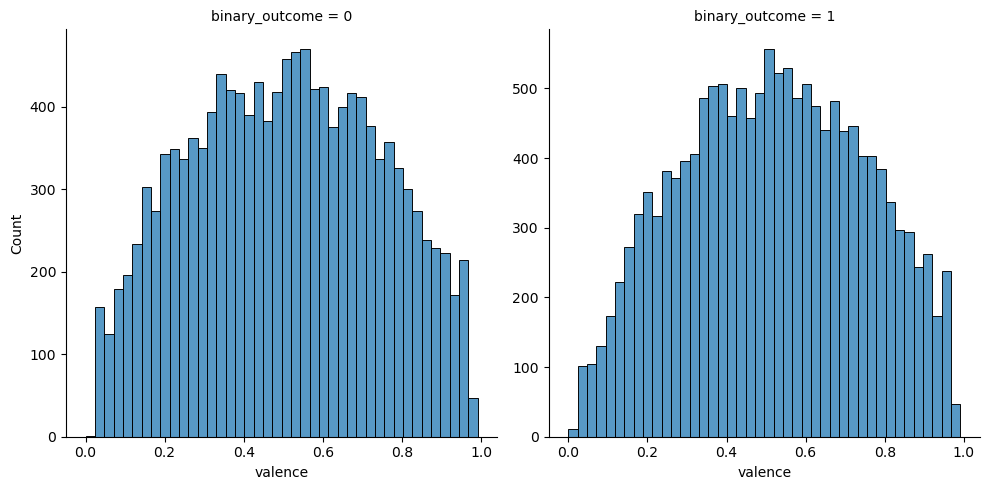

In [48]:
sns.displot(data=df_copy, x='valence', kind='hist', col='binary_outcome',
           facet_kws={'sharey':False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


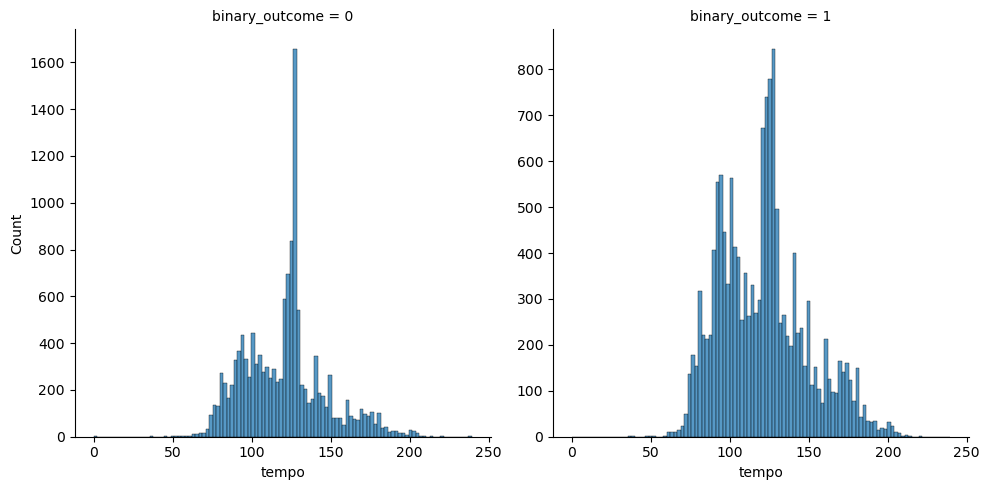

In [49]:
sns.displot(data=df_copy, x='tempo', kind='hist', col='binary_outcome',
           facet_kws={'sharey':False})

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


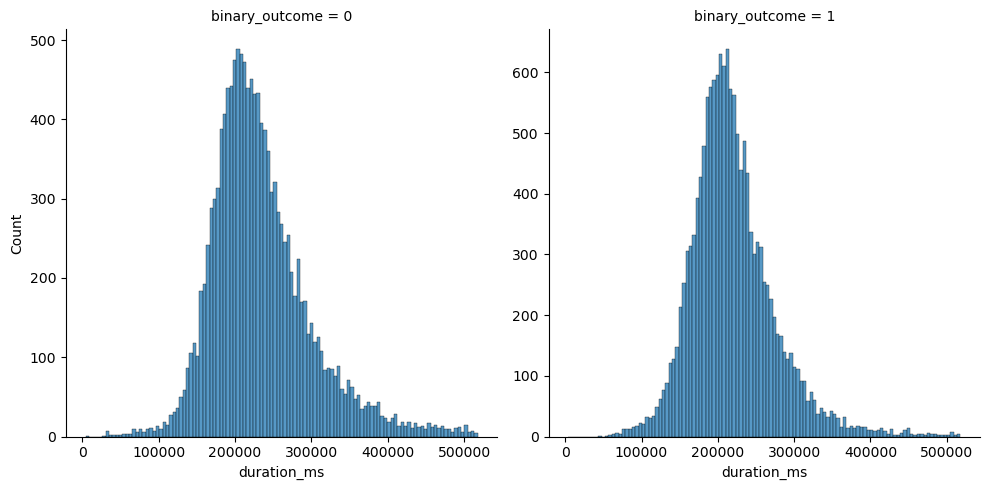

In [50]:
sns.displot(data=df_copy, x='duration_ms', kind='hist', col='binary_outcome',
           facet_kws={'sharey':False})

plt.show()

Distributions seem to be very very similar between outcome groups.

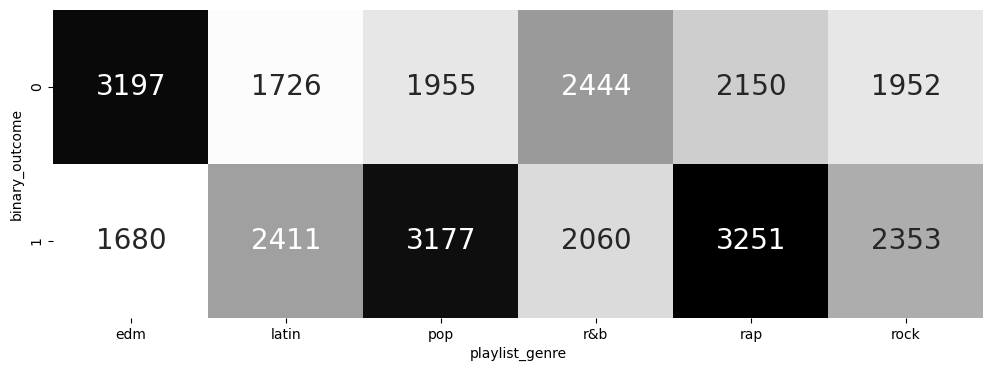

In [51]:
fig, ax = plt.subplots(figsize=(12,4))

sns.heatmap(data=pd.crosstab(df_copy.binary_outcome, df_copy.playlist_genre),
            annot=True, annot_kws = {'fontsize':20}, fmt='d', cbar=False, cmap='Greys', ax=ax)

plt.show()

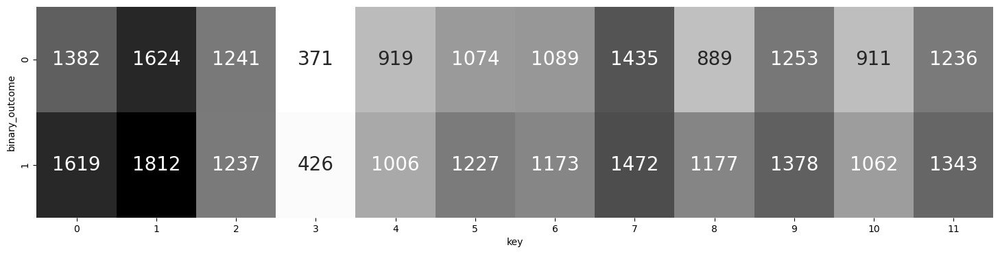

In [52]:
fig, ax = plt.subplots(figsize=(18,4))

sns.heatmap(data=pd.crosstab(df_copy.binary_outcome, df_copy.key),
            annot=True, annot_kws = {'fontsize':20}, fmt='d', cbar=False, cmap='Greys', ax=ax)

plt.show()

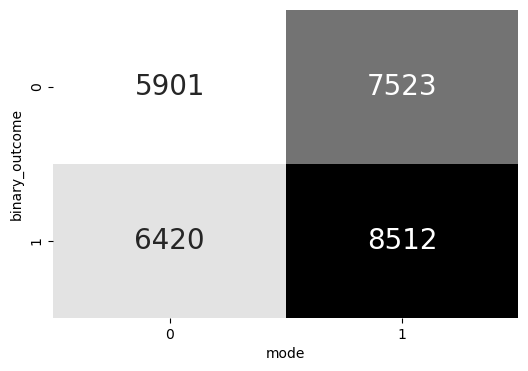

In [53]:
fig, ax = plt.subplots(figsize=(6,4))

sns.heatmap(data=pd.crosstab(df_copy.binary_outcome, df_copy['mode']),
            annot=True, annot_kws = {'fontsize':20}, fmt='d', cbar=False, cmap='Greys', ax=ax)

plt.show()

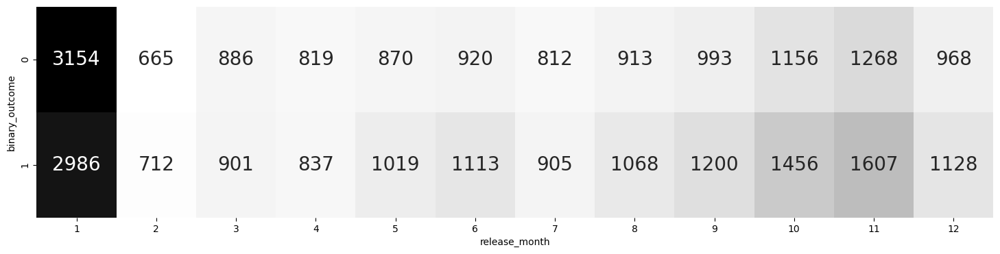

In [54]:
fig, ax = plt.subplots(figsize=(18,4))

sns.heatmap(data=pd.crosstab(df_copy.binary_outcome, df_copy.release_month),
            annot=True, annot_kws = {'fontsize':20}, fmt='d', cbar=False, cmap='Greys', ax=ax)

plt.show()

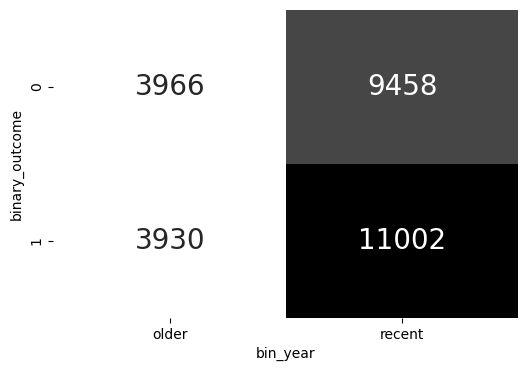

In [55]:
fig, ax = plt.subplots(figsize=(6,4))

sns.heatmap(data=pd.crosstab(df_copy.binary_outcome, df_copy.bin_year),
            annot=True, annot_kws = {'fontsize':20}, fmt='d', cbar=False, cmap='Greys', ax=ax)

plt.show()

## C. Clustering (15 points)
* Include how you identified the optimal number of clusters, and the required interpretation/visualization of the cluster results in the main report.
* The supporting document can include as much as you want. Again, treat the supporting the document as practice. This way you can have a notebook dedicated to clustering and keep that separate from the EDA and predictive modeling practice. Ensure that your EDA and reporting are thorough and remember that inferences drawn from your visualizations are essential to demonstrate your analytical skills.

*code copied from clustering notebook*

In [56]:
## create a dataframe of continuous variables for clustering
df_cluster = df_copy.loc[:, ['danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms']].copy()

## import modules to help with data standardization and clustering
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

## standardize data
X = StandardScaler().fit_transform(df_cluster)

I used first the knee bend curve, then hierarchical clustering to determine that 6 clusters were optimal.

The knee bend shows a decrease in slope around 5 or 6 clusters & the Ward clusters show 6 distinct branches.

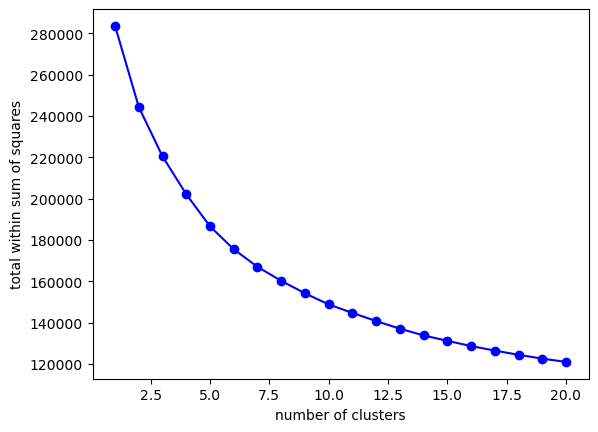

In [57]:
# knee bend plot

tots_within = []

K = range(1,21)

for k in K:
    km = KMeans(n_clusters=k, random_state=121, n_init=25, max_iter=500)
    km = km.fit(X)
    tots_within.append(km.inertia_)

fig, ax = plt.subplots()

ax.plot(K, tots_within, 'bo-')
ax.set_xlabel('number of clusters')
ax.set_ylabel('total within sum of squares')

plt.show()

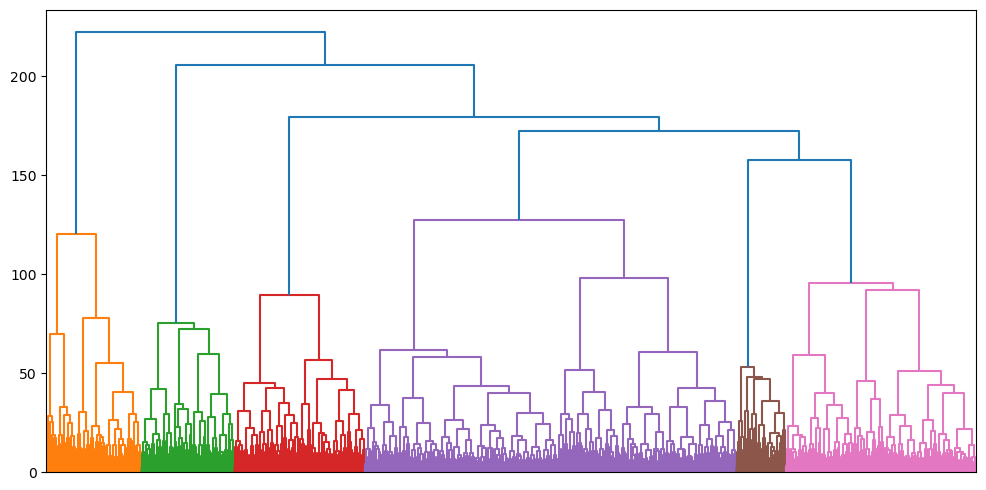

In [58]:
## import module
from scipy.cluster import hierarchy 

## hierarchical cluster
hclust_ward = hierarchy.ward(X)

## visualize cluster
fig = plt.figure(figsize=(12,6))

dn = hierarchy.dendrogram(hclust_ward, no_labels=True)

plt.show()

In [59]:
## cluster based on the optimal number of clusters
clusters_6 = KMeans(n_clusters=6, random_state=121, n_init=25, max_iter=500).fit_predict(X)

## create a copy of the cluster data frame and assign results 
df_cluster_copy = df_cluster.copy()
df_cluster_copy['k6'] = pd.Series(clusters_6, index=df_cluster.index).astype('category')

## add back categoricals from the original data set
df_cluster_copy['playlist_genre'] = df_copy['playlist_genre'].astype('category')
df_cluster_copy['binary_outcome'] = df_copy['binary_outcome'].astype('category')

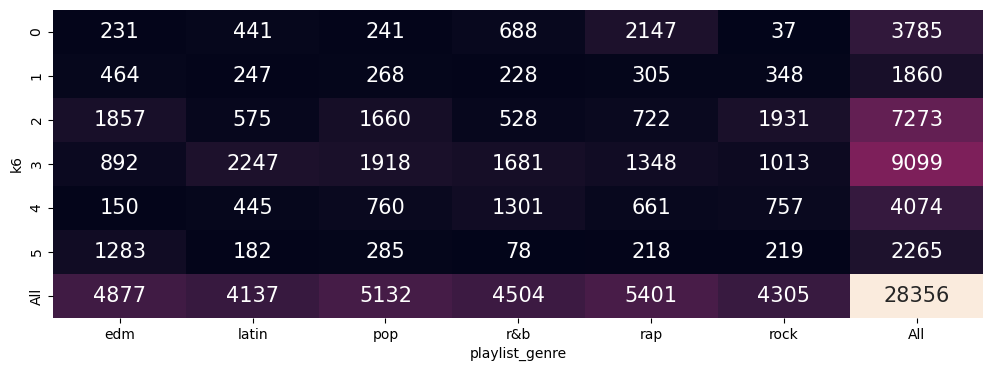

In [60]:
## visualize cluster performance in relation to the playlist_genre variable
fig, ax = plt.subplots(figsize=(12,4))

sns.heatmap(data=pd.crosstab(df_cluster_copy.k6, df_cluster_copy.playlist_genre, margins=True),
           annot=True, annot_kws={'fontsize':15}, fmt='g',
           cbar=False, ax=ax)

plt.show()

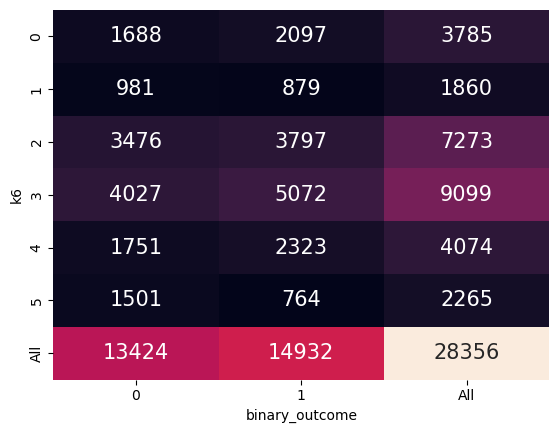

In [61]:
## visualize cluster performance in relation to the binary_outcome variable
fig, ax = plt.subplots()

sns.heatmap(data=pd.crosstab(df_cluster_copy.k6, df_cluster_copy.binary_outcome, margins=True),
           annot=True, annot_kws={'fontsize':15}, fmt='g',
           cbar=False, ax=ax)

plt.show()

The clustering was not reliably able to group songs by `playlist_genre` or `binary_outcome`.

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


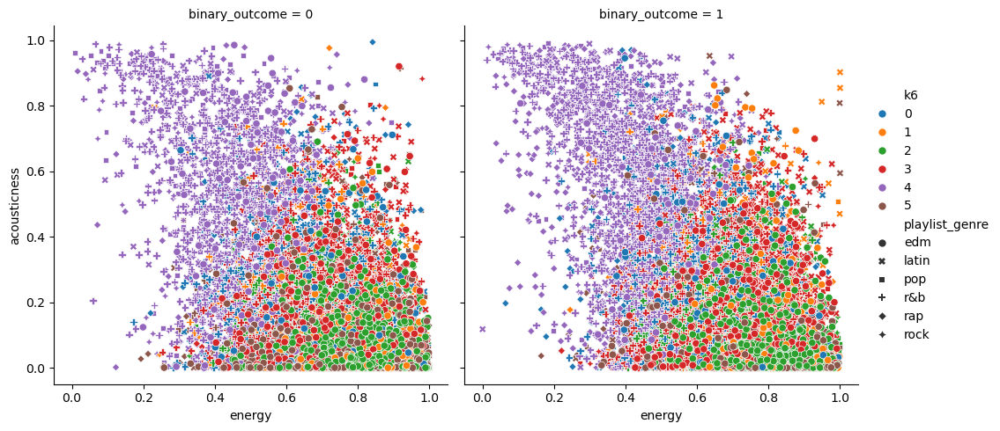

In [62]:
sns.relplot(data=df_cluster_copy, x='energy', y='acousticness', hue='k6', style='playlist_genre', col='binary_outcome')

plt.show()

By taking this example of a continuous-continuous relationship, we can see that songs that share similar continuous variable values are grouped, but we cannot see a reliable difference between known categorical groupings.

## D. Models: Fitting and Interpretation (30 points)

*code copied from modeling notebook*

## Read Data

In my clustering notebook, I saved the standardized, cleaned data to a .csv file.

In [63]:
dfa = pd.read_csv('spotify_data_standard_clean.csv')

In [64]:
## select and modify data types
dfa['release_month'] = dfa.release_month.astype('category')
dfa['playlist_genre'] = dfa.playlist_genre.astype('category')
dfa['mode'] = dfa['mode'].astype('category')
dfa['key'] = dfa.key.astype('category')
dfa['bin_year'] = dfa.bin_year.astype('category')

**Formulations you must consider:**
* No INPUTS! Fit an INTERCEPT-ONLY or CONSTANT AVERAGE model.
* Categorical inputs with additive features.
* Continuous inputs with linear additive features.
* All inputs (continuous and categorical) with linear additive features.
* Continuous inputs with linear main effect and pair-wise interactions.
* Interact the categorical inputs with the continuous inputs. This model must include the linear main effects as well (the formula interface helps with the interactions).

**You MUST also try 2 additional formulations. The additional formulations are up to you, but base you choices on your EDA. So what could you try? Here are several examples:**
* If you noticed a potential non-linear relationship between the output and an INPUT you should include polynomial features in the model. You may want to try interacting categorical inputs with linear (main effect) and polynomial features derived from the continuous inputs. This checks if the non-linear relationship changes across categories.
* If you noticed the output has cyclical behavior or a repeating pattern with respect to an input then you could apply the SIN() function to inputs. You should standardize the inputs BEFORE applying SIN(). Interacting the SIN() function with categorical inputs allows you to check if the repeating pattern changes across categories.
* You will fit a total of 8 models. The Spotify Songs application has a single main output. As stated in the project feedback, you can treat this as a regression task after applying an appropriate transformation. Alternatively, you can convert the problem to a classification task. You may decide which approach you want to work on.

In [65]:
formula_list = ['binary_outcome ~ 1',
         'binary_outcome ~ bin_year + playlist_genre + key + mode + release_month',
         'binary_outcome ~ danceability + energy + loudness + speechiness + acousticness + instrumentalness + liveness + valence + tempo + duration_ms',
         'binary_outcome ~ bin_year + playlist_genre + key + mode + release_month + danceability + energy + loudness + speechiness + acousticness + instrumentalness + liveness + valence + tempo + duration_ms',
         'binary_outcome ~ (danceability + energy + loudness + speechiness + acousticness + instrumentalness + liveness + valence + tempo + duration_ms) ** 2',
          'binary_outcome ~ (bin_year + playlist_genre + key + mode + release_month) * (danceability + energy + loudness + speechiness + acousticness + instrumentalness + liveness + valence + tempo + duration_ms)',
          'binary_outcome ~ (bin_year + playlist_genre + key + mode + release_month) * ((danceability + energy + loudness + speechiness + acousticness + instrumentalness + liveness + valence + tempo + duration_ms)**2) + np.power(danceability, 2) + np.power(energy, 2) + np.power(loudness, 2) + np.power(speechiness, 2) + np.power(acousticness, 2) + np.power(instrumentalness, 2) + np.power(liveness, 2) + np.power(valence, 2) + np.power(tempo, 2) + np.power(duration_ms, 2)',
         'binary_outcome ~ (bin_year + playlist_genre + key + mode + release_month) * (np.power(danceability, 2) + np.power(energy, 2) + np.power(loudness, 2) + np.power(speechiness, 2) + np.power(acousticness, 2) + np.power(instrumentalness, 2) + np.power(liveness, 2) + np.power(valence, 2) + np.power(tempo, 2) + np.power(duration_ms, 2))']

**For each model that you fit you must answer the following questions associated with the regression coefficients:**
* How many coefficients were estimated?
* How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?
* WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?
* Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

#### Import Modules

In [66]:
import statsmodels.formula.api as smf
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

#### Define Functions

During modeling, I found it helpful to define my own functions to help with producing values to answer the above questions per model. These are copied from my modeling notebook.

In [67]:
def significant_coefs(mod):
    ## statistically significant features
    significant = mod.pvalues[mod.pvalues < 0.05]
    
    ## get their coefficients
    significant_coefs = mod.params[significant.index]
    
    ## see if they are positive or negative
    result = pd.DataFrame({'coef_value': significant_coefs,
    'sign': ['positive' if x > 0 else 'negative' for x in significant_coefs]})

    return result

In [68]:
def print_coef_summaries(mod):
    print('Coefficients Estimated:', len(mod.params))
    print('Number of Statistically Significant Coefficients:', (mod.pvalues < 0.05).sum())

In [69]:
def two_most_sig_coef(mod):
    ## create a dataframe of the pvalues and if they are significant
    mod_pvalue_df = pd.merge(pd.DataFrame(mod.pvalues).reset_index().rename(columns={'index':'feature', 0:'pvalue'}),
         pd.DataFrame(mod.pvalues < 0.05).reset_index().rename(columns={'index':'feature', 0:'significant'}),
         how='left', on='feature')

    ## add positive/negative column
    mod_pvalue_df['sign'] = np.where(mod_pvalue_df.pvalue > 0, 'pos', 'neg')

    ## add absolute value column
    mod_pvalue_df['absolute_value'] = np.abs(mod_pvalue_df.pvalue).round(8)

    ## return the two highest absolute pvalues
    return mod_pvalue_df.loc[mod_pvalue_df.significant == True, :].sort_values(by='absolute_value', ascending=False)[:2]

#### Fit the Models

In [70]:
fit_0 = smf.logit(formula = formula_list[0], data = dfa).fit()
fit_1 = smf.logit(formula = formula_list[1], data = dfa).fit()
fit_2 = smf.logit(formula = formula_list[2], data = dfa).fit()
fit_3 = smf.logit(formula = formula_list[3], data = dfa).fit()
fit_4 = smf.logit(formula = formula_list[4], data = dfa).fit()
fit_5 = smf.logit(formula = formula_list[5], data = dfa).fit()
fit_6 = smf.logit(formula = formula_list[6], data = dfa).fit()
fit_7 = smf.logit(formula = formula_list[7], data = dfa).fit()

Optimization terminated successfully.
         Current function value: 0.691732
         Iterations 3
Optimization terminated successfully.
         Current function value: 0.668754
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.671088
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664365
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604431
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.654088
         Iterations 6


#### How many coefficients (and thus features) are STATISTICALLY SIGNIFICANT using commonly accepted thresholds?

In [71]:
significant_coefs(fit_0)

,coef_value,sign
Intercept,0.106462,positive


In [72]:
significant_coefs(fit_1)

,coef_value,sign
Intercept,-1.037242,negative
bin_year[T.recent],0.242916,positive
playlist_genre[T.latin],1.033908,positive
playlist_genre[T.pop],1.170569,positive
playlist_genre[T.r&b],0.592097,positive
playlist_genre[T.rap],1.131165,positive
playlist_genre[T.rock],1.042513,positive
key[T.2],-0.135018,negative
key[T.8],0.139908,positive
release_month[T.5],0.196846,positive


In [73]:
significant_coefs(fit_2)

,coef_value,sign
Intercept,0.106449,positive
energy,-0.323265,negative
loudness,0.251933,positive
speechiness,-0.032061,negative
acousticness,0.074589,positive
instrumentalness,-0.150256,negative
liveness,-0.046348,negative
valence,0.060084,positive
tempo,0.040515,positive
duration_ms,-0.208486,negative


In [74]:
significant_coefs(fit_3)

,coef_value,sign
Intercept,-0.714244,negative
playlist_genre[T.latin],0.794489,positive
playlist_genre[T.pop],0.963800,positive
playlist_genre[T.r&b],0.312215,positive
playlist_genre[T.rap],0.882270,positive
playlist_genre[T.rock],1.016660,positive
key[T.2],-0.113222,negative
key[T.8],0.142548,positive
release_month[T.5],0.185718,positive
release_month[T.6],0.247353,positive


In [75]:
significant_coefs(fit_4)

,coef_value,sign
Intercept,0.090007,positive
energy,-0.309834,negative
loudness,0.270649,positive
speechiness,-0.038559,negative
acousticness,0.083617,positive
instrumentalness,-0.157435,negative
liveness,-0.044620,negative
valence,0.038700,positive
duration_ms,-0.201780,negative
danceability:energy,-0.077120,negative


In [76]:
significant_coefs(fit_5)

,coef_value,sign
Intercept,-0.661322,negative
playlist_genre[T.latin],0.684828,positive
playlist_genre[T.pop],0.930023,positive
playlist_genre[T.r&b],0.181395,positive
playlist_genre[T.rap],0.804378,positive
...,...,...
key[T.9]:duration_ms,-0.281280,negative
key[T.10]:duration_ms,-0.145334,negative
key[T.11]:duration_ms,-0.283643,negative
release_month[T.2]:duration_ms,0.148798,positive


In [77]:
significant_coefs(fit_6)

,coef_value,sign
Intercept,-0.752711,negative
playlist_genre[T.latin],0.688544,positive
playlist_genre[T.pop],0.964528,positive
playlist_genre[T.rap],0.928887,positive
playlist_genre[T.rock],0.977639,positive
...,...,...
"np.power(danceability, 2)",0.035774,positive
"np.power(energy, 2)",-0.097102,negative
"np.power(acousticness, 2)",-0.056098,negative
"np.power(instrumentalness, 2)",0.048654,positive


In [78]:
significant_coefs(fit_7)

,coef_value,sign
Intercept,-0.873138,negative
bin_year[T.recent],0.223834,positive
playlist_genre[T.latin],0.754850,positive
playlist_genre[T.pop],1.050990,positive
playlist_genre[T.r&b],0.311828,positive
playlist_genre[T.rap],0.881489,positive
playlist_genre[T.rock],0.924749,positive
release_month[T.5],0.312056,positive
release_month[T.6],0.216856,positive
release_month[T.8],0.206380,positive


#### WHICH coefficients (and thus features) are STATISTICALLY SIGNIFICANT and what are the coefficients POSITIVE or NEGATIVE for those features?


In [79]:
print_coef_summaries(fit_0)

Coefficients Estimated: 1
Number of Statistically Significant Coefficients: 1


In [80]:
print_coef_summaries(fit_1)

Coefficients Estimated: 30
Number of Statistically Significant Coefficients: 17


In [81]:
print_coef_summaries(fit_2)

Coefficients Estimated: 11
Number of Statistically Significant Coefficients: 10


In [82]:
print_coef_summaries(fit_3)

Coefficients Estimated: 40
Number of Statistically Significant Coefficients: 25


In [83]:
print_coef_summaries(fit_4)

Coefficients Estimated: 56
Number of Statistically Significant Coefficients: 24


In [84]:
print_coef_summaries(fit_5)

Coefficients Estimated: 330
Number of Statistically Significant Coefficients: 73


In [85]:
print_coef_summaries(fit_6)

Coefficients Estimated: 1690
Number of Statistically Significant Coefficients: 192


In [86]:
print_coef_summaries(fit_7)

Coefficients Estimated: 330
Number of Statistically Significant Coefficients: 55


#### Which two STATISTICALLY SIGNIFICANT coefficients (and thus features) have the highest MAGNITUDE coefficient values?

In [87]:
two_most_sig_coef(fit_0)

,feature,pvalue,significant,sign,absolute_value
0,Intercept,3.521304e-19,True,pos,0.0


In [88]:
two_most_sig_coef(fit_1)

,feature,pvalue,significant,sign,absolute_value
14,key[T.8],0.017812,True,pos,0.017812
8,key[T.2],0.015222,True,pos,0.015222


In [89]:
two_most_sig_coef(fit_2)

,feature,pvalue,significant,sign,absolute_value
4,speechiness,0.010383,True,pos,0.010383
9,tempo,0.001239,True,pos,0.001239


In [90]:
two_most_sig_coef(fit_3)

,feature,pvalue,significant,sign,absolute_value
8,key[T.2],0.044662,True,pos,0.044662
36,liveness,0.019025,True,pos,0.019025


In [91]:
two_most_sig_coef(fit_4)

,feature,pvalue,significant,sign,absolute_value
17,danceability:valence,0.048635,True,pos,0.048635
16,danceability:liveness,0.042159,True,pos,0.042159


In [92]:
two_most_sig_coef(fit_5)

,feature,pvalue,significant,sign,absolute_value
286,key[T.10]:tempo,0.048862,True,pos,0.048862
146,release_month[T.9]:speechiness,0.048233,True,pos,0.048233


In [93]:
two_most_sig_coef(fit_6)

,feature,pvalue,significant,sign,absolute_value
112,release_month[T.5]:loudness,0.049895,True,pos,0.049895
92,playlist_genre[T.latin]:loudness,0.049539,True,pos,0.049539


In [94]:
two_most_sig_coef(fit_7)

,feature,pvalue,significant,sign,absolute_value
205,"release_month[T.8]:np.power(instrumentalness, 2)",0.047966,True,pos,0.047966
27,release_month[T.10],0.047920,True,pos,0.047920


**Predicted vs. Observed Plots**

In [95]:
## create a copy of the dataframe
dfa_pred = dfa.copy()

## predict the training set for all models
dfa_pred['pred_prob_mod_0'] = fit_0.predict(dfa)
dfa_pred['pred_prob_mod_1'] = fit_1.predict(dfa)
dfa_pred['pred_prob_mod_2'] = fit_2.predict(dfa)
dfa_pred['pred_prob_mod_3'] = fit_3.predict(dfa)
dfa_pred['pred_prob_mod_4'] = fit_4.predict(dfa)
dfa_pred['pred_prob_mod_5'] = fit_5.predict(dfa)
dfa_pred['pred_prob_mod_6'] = fit_6.predict(dfa)
dfa_pred['pred_prob_mod_7'] = fit_7.predict(dfa)

## classify predictions on the training set
dfa_pred['pred_class_mod_0'] = np.where(dfa_pred.pred_prob_mod_0 > 0.5, 1, 0)
dfa_pred['pred_class_mod_1'] = np.where(dfa_pred.pred_prob_mod_1 > 0.5, 1, 0)
dfa_pred['pred_class_mod_2'] = np.where(dfa_pred.pred_prob_mod_2 > 0.5, 1, 0)
dfa_pred['pred_class_mod_3'] = np.where(dfa_pred.pred_prob_mod_3 > 0.5, 1, 0)
dfa_pred['pred_class_mod_4'] = np.where(dfa_pred.pred_prob_mod_4 > 0.5, 1, 0)
dfa_pred['pred_class_mod_5'] = np.where(dfa_pred.pred_prob_mod_5 > 0.5, 1, 0)
dfa_pred['pred_class_mod_6'] = np.where(dfa_pred.pred_prob_mod_6 > 0.5, 1, 0)
dfa_pred['pred_class_mod_7'] = np.where(dfa_pred.pred_prob_mod_7 > 0.5, 1, 0)

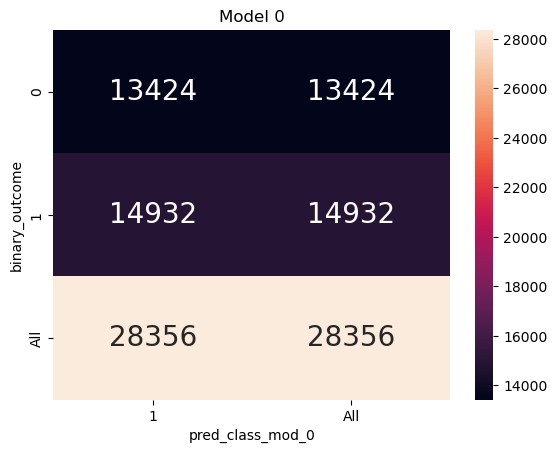

In [96]:
fig, ax = plt.subplots()

sns.heatmap(data=pd.crosstab(dfa_pred.binary_outcome, dfa_pred.pred_class_mod_0, margins=True),
           annot=True, annot_kws={'fontsize':20}, fmt='g')

ax.set_title('Model 0')

plt.show()

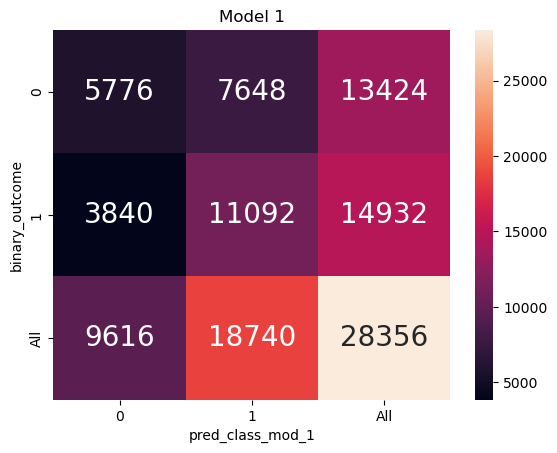

In [97]:
fig, ax = plt.subplots()

sns.heatmap(data=pd.crosstab(dfa_pred.binary_outcome, dfa_pred.pred_class_mod_1, margins=True),
           annot=True, annot_kws={'fontsize':20}, fmt='g')

ax.set_title('Model 1')

plt.show()

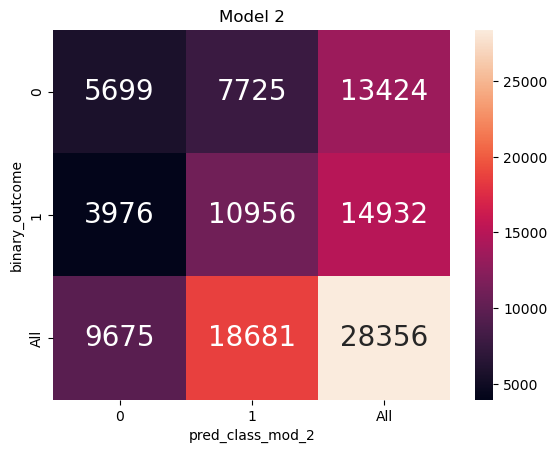

In [98]:
fig, ax = plt.subplots()

sns.heatmap(data=pd.crosstab(dfa_pred.binary_outcome, dfa_pred.pred_class_mod_2, margins=True),
           annot=True, annot_kws={'fontsize':20}, fmt='g')

ax.set_title('Model 2')

plt.show()

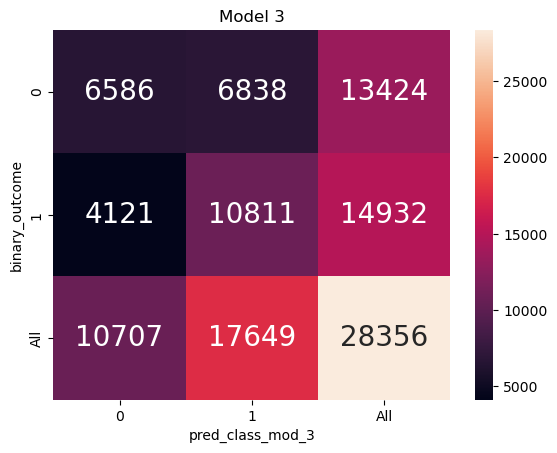

In [99]:
fig, ax = plt.subplots()

sns.heatmap(data=pd.crosstab(dfa_pred.binary_outcome, dfa_pred.pred_class_mod_3, margins=True),
           annot=True, annot_kws={'fontsize':20}, fmt='g')

ax.set_title('Model 3')

plt.show()

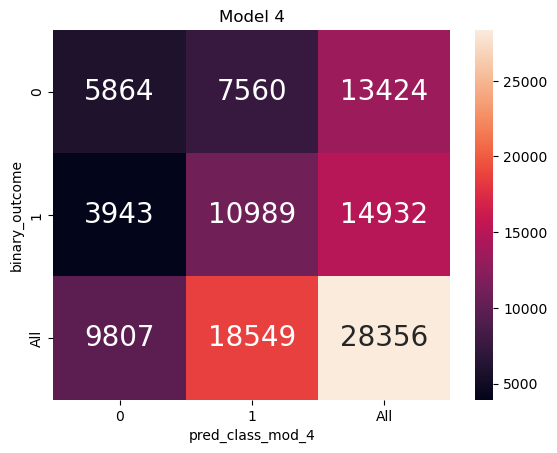

In [100]:
fig, ax = plt.subplots()

sns.heatmap(data=pd.crosstab(dfa_pred.binary_outcome, dfa_pred.pred_class_mod_4, margins=True),
           annot=True, annot_kws={'fontsize':20}, fmt='g')

ax.set_title('Model 4')

plt.show()

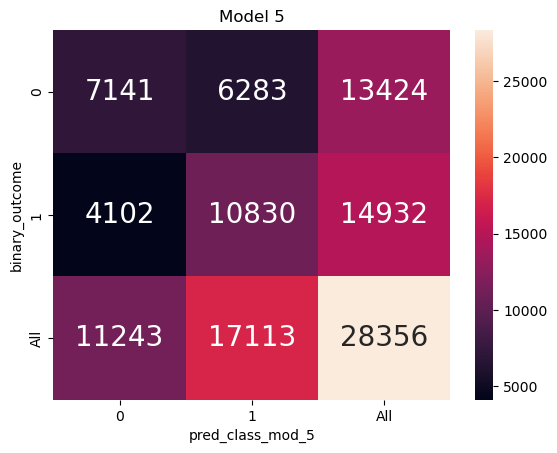

In [101]:
fig, ax = plt.subplots()

sns.heatmap(data=pd.crosstab(dfa_pred.binary_outcome, dfa_pred.pred_class_mod_5, margins=True),
           annot=True, annot_kws={'fontsize':20}, fmt='g')

ax.set_title('Model 5')

plt.show()

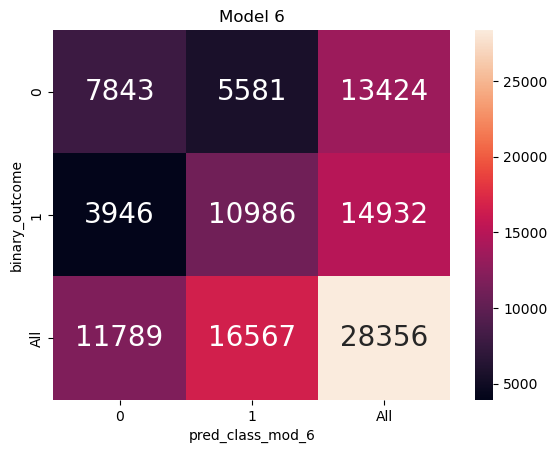

In [102]:
fig, ax = plt.subplots()

sns.heatmap(data=pd.crosstab(dfa_pred.binary_outcome, dfa_pred.pred_class_mod_6, margins=True),
           annot=True, annot_kws={'fontsize':20}, fmt='g')

ax.set_title('Model 6')

plt.show()

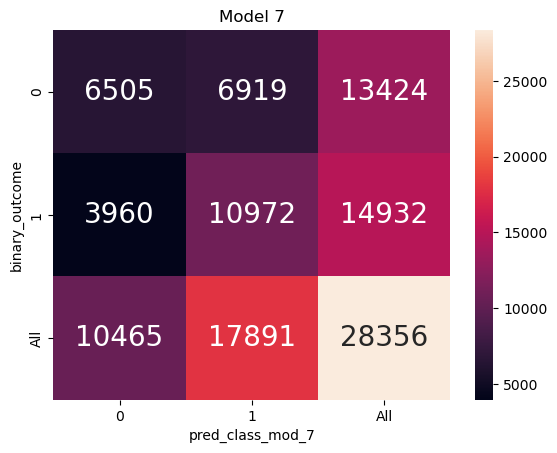

In [103]:
fig, ax = plt.subplots()

sns.heatmap(data=pd.crosstab(dfa_pred.binary_outcome, dfa_pred.pred_class_mod_7, margins=True),
           annot=True, annot_kws={'fontsize':20}, fmt='g')

ax.set_title('Model 7')

plt.show()

**For each model that you fit you must show the performance on the training set. What you show depends on whether you are working on a REGRESSION or CLASSIFICATION task.**

For each model show the CONFUSION MATRIX on the training set assuming a 0.5 threshold; The Accuracy, Sensitivity, Specificity, and FPR on the training set assuming a 0.5 threshold; the ROC curve on the training set; and the Area Under the ROC curve (ROC AUC) value.

In [104]:
## function copied from 'week_12_classification_multiple_models.ipynb'

def fit_and_assess_logistic(mod_name, a_formula, train_data, threshold):
    a_mod = smf.logit(formula=a_formula, data=train_data).fit()
    train_copy = train_data.copy()
    train_copy['pred_probability'] = a_mod.predict(train_data)
    train_copy['pred_class'] = np.where(train_copy.pred_probability > threshold, 1, 0)
    TN, FP, FN, TP = confusion_matrix(train_copy.binary_outcome.to_numpy(), train_copy.pred_class.to_numpy()).ravel()
    Accuracy = (TN + TP) / (TN + TP + FP + FN)
    Sensitivity = (TP) / (TP + FN)
    Specificity = (TN) / (TN + FP)
    FPR = 1 - Specificity
    ROC_AUC = roc_auc_score(train_copy.binary_outcome.to_numpy(), train_copy.pred_probability.to_numpy())
    res_dict = {'model_name': mod_name,
               'model formula' : a_formula,
               'num_coefs': len(a_mod.params),
                'True Negative':TN,
               'False Positive':FP,
               'False Negative':FN,
               'True Positive':TP,
               'threshold': threshold,
               'Accuracy': Accuracy,
               'Sensitivity': Sensitivity,
               'Specificity': Specificity,
               'FPR': FPR,
               'ROC_AUC': ROC_AUC}
    return pd.DataFrame(res_dict, index=[0])

In [105]:
## initiate an empty list
results_list = []

## iterate and store results
for m in range(len(formula_list)):
    results_list.append( fit_and_assess_logistic( m, formula_list[m], train_data=dfa, threshold=0.5))

## combine results into one dataframe
results_df = pd.concat(results_list, ignore_index=True)

## modify model_name into a category for better viz
results_df['model_name'] = results_df.model_name.astype('category')

results_df

Optimization terminated successfully.
         Current function value: 0.691732
         Iterations 3
Optimization terminated successfully.
         Current function value: 0.668754
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.671088
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664365
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604431
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.654088
         Iterations 6


,model_name,model formula,num_coefs,True Negative,False Positive,False Negative,True Positive,threshold,Accuracy,Sensitivity,Specificity,FPR,ROC_AUC
0,0,binary_outcome ~ 1,1,0,13424,0,14932,0.5,0.526590,1.000000,0.000000,1.000000,0.500000
1,1,binary_outcome ~ bin_year + playlist_genre + k...,30,5776,7648,3840,11092,0.5,0.594865,0.742834,0.430274,0.569726,0.618489
2,2,binary_outcome ~ danceability + energy + loudn...,11,5699,7725,3976,10956,0.5,0.587354,0.733726,0.424538,0.575462,0.614421
3,3,binary_outcome ~ bin_year + playlist_genre + k...,40,6586,6838,4121,10811,0.5,0.613521,0.724016,0.490614,0.509386,0.651638
4,4,binary_outcome ~ (danceability + energy + loud...,56,5864,7560,3943,10989,0.5,0.594336,0.735936,0.436830,0.563170,0.628555
5,5,binary_outcome ~ (bin_year + playlist_genre + ...,330,7141,6283,4102,10830,0.5,0.633764,0.725288,0.531958,0.468042,0.679199
6,6,binary_outcome ~ (bin_year + playlist_genre + ...,1690,7843,5581,3946,10986,0.5,0.664022,0.735735,0.584252,0.415748,0.727187
7,7,binary_outcome ~ (bin_year + playlist_genre + ...,330,6505,6919,3960,10972,0.5,0.616342,0.734798,0.484580,0.515420,0.651009


ROC Curve

In [106]:
## function copied from 'week_12_classification_multiple_models.ipynb'

def fit_logistic_make_roc(mod_name, a_formula, train_data):
    a_mod = smf.logit(formula = a_formula, data = train_data).fit()
    train_copy = train_data.copy()
    train_copy['pred_probability'] = a_mod.predict(train_data)
    fpr, tpr, threshold = roc_curve(train_data.binary_outcome.to_numpy(), train_copy.pred_probability.to_numpy())
    res_df = pd.DataFrame({'tpr':tpr,
                          'fpr':fpr,
                          'threshold':threshold})
    res_df['model_name'] = mod_name
    res_df['model_formula'] = a_formula
    return res_df

In [107]:
## follow same procedure as above for iteration and storage
roc_list = []

for m in range(len(formula_list)):
    roc_list.append( fit_logistic_make_roc( mod_name=m, a_formula=formula_list[m], train_data=dfa))

roc_df = pd.concat(roc_list, ignore_index=True)

roc_df['model_name'] = roc_df.model_name.astype('category')

Optimization terminated successfully.
         Current function value: 0.691732
         Iterations 3
Optimization terminated successfully.
         Current function value: 0.668754
         Iterations 4
Optimization terminated successfully.
         Current function value: 0.671088
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.655160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.664365
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.640975
         Iterations 6
Optimization terminated successfully.
         Current function value: 0.604431
         Iterations 7
Optimization terminated successfully.
         Current function value: 0.654088
         Iterations 6


/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


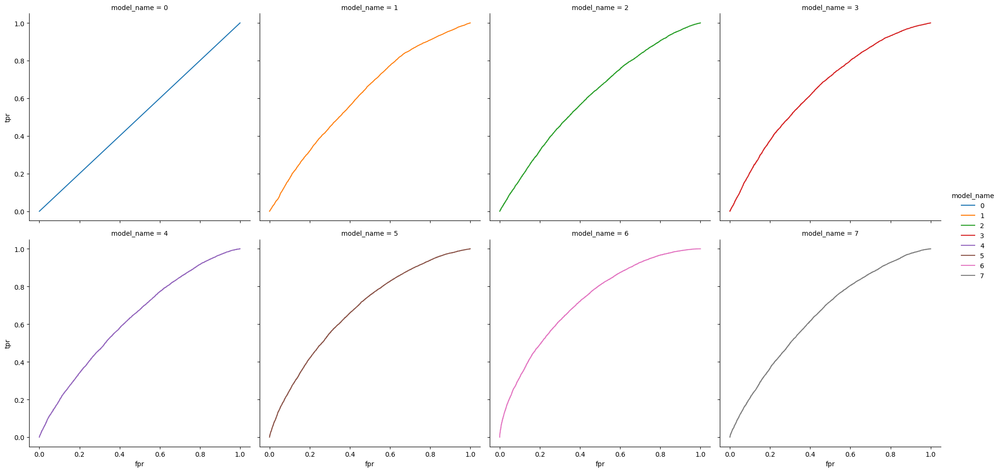

In [108]:
sns.relplot(data=roc_df, x='fpr', y='tpr', hue='model_name',
           kind='line', estimator=None, units='model_name',
           col='model_name', col_wrap=4)

plt.show()

**Which model has the best performance on the training set? Is the best model different when considering Accuracy vs ROC AUC? Is the best model better than the INTERCEPT-ONLY model? How many coefficients are associated with the BEST model?**

Model 6 has the best performance on the training set by Accuracy and ROC AUC. It did perform better than intercept only. Model 6 has 1690 coefficients estimated. 

* Fits all required models, including specified formulations and two additional models based on EDA findings.
  * Models listed and fit above
* Analyzes and interprets coefficients for the top two performing models and any model of your choice, identifying statistically significant features and their positive or negative influence.
  * The two top models were model 6 and 5 according to ROC_AUC and Accuracy. The model of my choice is the linear additive formula (model 3).
  * Model 6 had 1690 coefficients, 192 significant, the most of my 8 models. The features with the highest absolute value of significant coefficients were those that interacted release month (5) with loudness & the feature that interacted playlist genre (latin) and loudness. Both had positive influences.
  * Model 5 estimatd 330 coefficents, 73 significant. The features with the highest absolute values of significant coefficients were interactions between key(10) and tempo & release month(9) and speechiness. Both had positive effects.
  * Model 3 estimated 40 coefficients, 25 significant. The features with the highest absolute values of significant coefficients were key(2) and liveness.
* Evaluates model performance using appropriate metrics, including Accuracy, Precision, Recall, F1 Score, and AUC. Provides visualizations such as predicted vs. observed plots, confusion matrices, and ROC curves to support a comprehensive assessment.
  * Metric tables and plots above. Confusion matricies included in a dataframe with Accuracy, etc.
* Compares model performances, discussing which model is best according to different metrics and whether it outperforms the intercept-only model.
  * Discussions above.

## E. Models: Predictions (15 points)
*The creation of your visualization grid and figure showing the predictive trends should be given in the main report.*
* Creates and utilizes visualization grids as per instructions, selecting the most important inputs based on model coefficients, with approaches tailored to regression or classification tasks.
* For Regression Problems, accurately visualizes predictions for both models, including average outputs, confidence intervals, and prediction intervals. For Classification Problems, accurately visualizes predicted event probabilities for both models.
* Discuss the confidence intervals, prediction intervals, or trends in uncertainty across model predictions. Explains what these indicate about the reliability of the model’s predictions and how this uncertainty might impact decision-making or further analysis.

*code copied from my predictions notebook*

In [109]:
## change the name of the mode column to make my life easier
dfa.rename(columns={'mode':'Mode'}, inplace=True)
dfa['Mode'] = dfa.Mode.astype('str')

## define the formulas for predictions
linear_additive_formula = 'binary_outcome ~ bin_year + playlist_genre + key + Mode + release_month + danceability + energy + loudness + speechiness + acousticness + instrumentalness + liveness + valence + tempo + duration_ms'
best_training_formula = 'binary_outcome ~ (bin_year + playlist_genre + key + Mode + release_month) * ((danceability + energy + loudness + speechiness + acousticness + instrumentalness + liveness + valence + tempo + duration_ms)**2) + np.power(danceability, 2) + np.power(energy, 2) + np.power(loudness, 2) + np.power(speechiness, 2) + np.power(acousticness, 2) + np.power(instrumentalness, 2) + np.power(liveness, 2) + np.power(valence, 2) + np.power(tempo, 2) + np.power(duration_ms, 2)'

## fit the models
fit_linear = smf.logit(formula = linear_additive_formula, data = dfa).fit()
fit_best = smf.logit(formula = best_training_formula, data = dfa).fit()

Optimization terminated successfully.
         Current function value: 0.655160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604431
         Iterations 7


In [110]:
## borrowing the formula I wrote in my fitting notebook and modifying it to 4

def three_most_sig_coef(mod):
    ## create a dataframe of the pvalues and if they are significant
    mod_pvalue_df = pd.merge(pd.DataFrame(mod.pvalues).reset_index().rename(columns={'index':'feature', 0:'pvalue'}),
         pd.DataFrame(mod.pvalues < 0.05).reset_index().rename(columns={'index':'feature', 0:'significant'}),
         how='left', on='feature')

    ## add positive/negative column
    mod_pvalue_df['sign'] = np.where(mod_pvalue_df.pvalue > 0, 'pos', 'neg')

    ## add absolute value column
    mod_pvalue_df['absolute_value'] = np.abs(mod_pvalue_df.pvalue).round(8)

    ## return the two highest absolute pvalues
    return mod_pvalue_df.loc[mod_pvalue_df.significant == True, :].sort_values(by='absolute_value', ascending=False)[:4]

In [111]:
three_most_sig_coef(fit_linear)

,feature,pvalue,significant,sign,absolute_value
8,key[T.2],0.044662,True,pos,0.044662
36,liveness,0.019025,True,pos,0.019025
14,key[T.8],0.017259,True,pos,0.017259
24,release_month[T.7],0.013618,True,pos,0.013618


In [112]:
three_most_sig_coef(fit_best)

,feature,pvalue,significant,sign,absolute_value
112,release_month[T.5]:loudness,0.049895,True,pos,0.049895
92,playlist_genre[T.latin]:loudness,0.049539,True,pos,0.049539
136,key[T.10]:speechiness,0.048989,True,pos,0.048989
8,key[T.2],0.048892,True,pos,0.048892


`liveness` is a continuous input, so I'll continue with these three features including `release_month` and `key`.

In [113]:
## create the viz grid

input_grid = pd.DataFrame([(liveness, key, release_month, playlist_genre, bin_year, danceability, energy, loudness, speechiness, acousticness, instrumentalness, valence, tempo, duration_ms, Mode) for liveness in np.linspace(dfa.liveness.min(), dfa.liveness.max(), num=101)
                                                                                 for key in dfa.key.unique()
                                                                                 for release_month in dfa.release_month.unique()
                                                                                 for playlist_genre in [pd.DataFrame(dfa.playlist_genre.value_counts().sort_values(ascending=False)).reset_index().iloc[0][0]]
                                                                                 for bin_year in [pd.DataFrame(dfa.bin_year.value_counts().sort_values(ascending=False)).reset_index().iloc[0][0]]
                                                                                 for danceability in [dfa.danceability.mean()]
                                                                                 for energy in [dfa.energy.mean()]
                                                                                 for loudness in [dfa.loudness.mean()]
                                                                                 for speechiness in [dfa.speechiness.mean()]
                                                                                 for acousticness in [dfa.acousticness.mean()]
                                                                                 for instrumentalness in [dfa.instrumentalness.mean()]
                                                                                 for valence in [dfa.valence.mean()]
                                                                                 for tempo in [dfa.tempo.mean()]
                                                                                 for duration_ms in [dfa.duration_ms.mean()]
                                                                                for Mode in [pd.DataFrame(dfa.Mode.value_counts().sort_values(ascending=False)).reset_index().iloc[0][0]]],
                                columns = ['liveness', 'key', 'release_month', 'playlist_genre', 'bin_year', 'danceability', 'energy', 'loudness', 'speechiness', 'acousticness', 'instrumentalness', 'valence', 'tempo', 'duration_ms', 'Mode'])

In [114]:
input_grid.nunique()

liveness            101
key                  12
release_month        12
playlist_genre        1
bin_year              1
danceability          1
energy                1
loudness              1
speechiness           1
acousticness          1
instrumentalness      1
valence               1
tempo                 1
duration_ms           1
Mode                  1
dtype: int64

In [115]:
## create a copy of the viz grid
viz_grid = input_grid.copy()

## predict the linear model
viz_grid['pred_probability_linear'] = fit_linear.predict(input_grid)

## predict the best model
viz_grid['pred_probability_best'] = fit_best.predict(input_grid)

## change key and release_month to categoricals for better visulazations
viz_grid['key'] = viz_grid.key.astype('category')
viz_grid['release_month'] = viz_grid.release_month.astype('category')

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


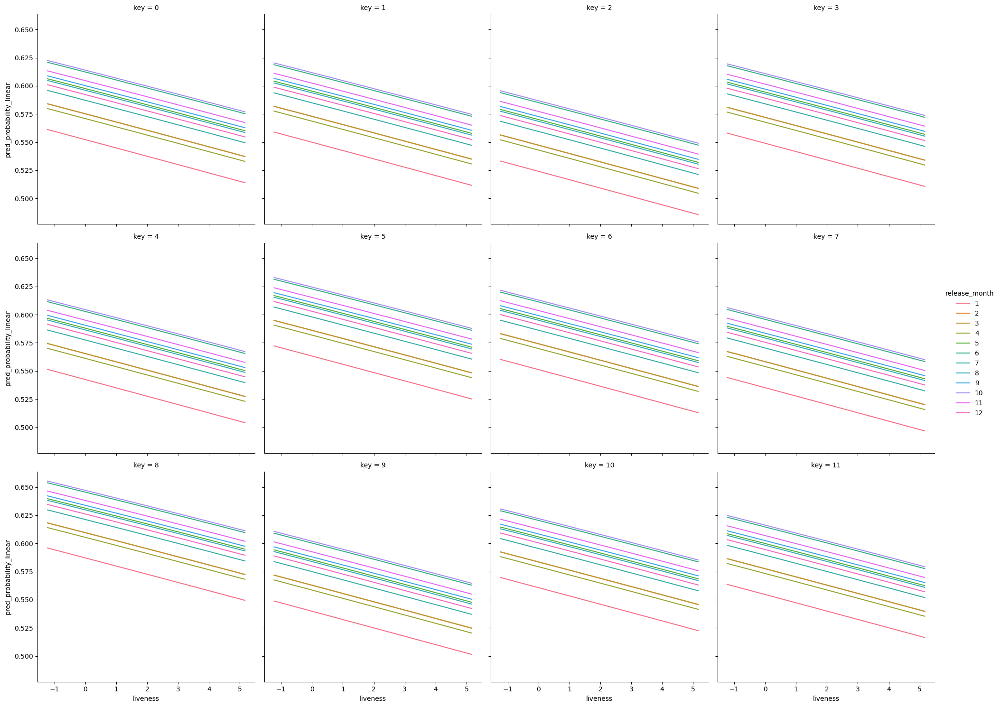

In [116]:
## viz the linear model

sns.relplot(data=viz_grid, x='liveness', y='pred_probability_linear', hue='release_month', col='key',
           kind='line', estimator=None, units='release_month',
           col_wrap=4)

plt.show()

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


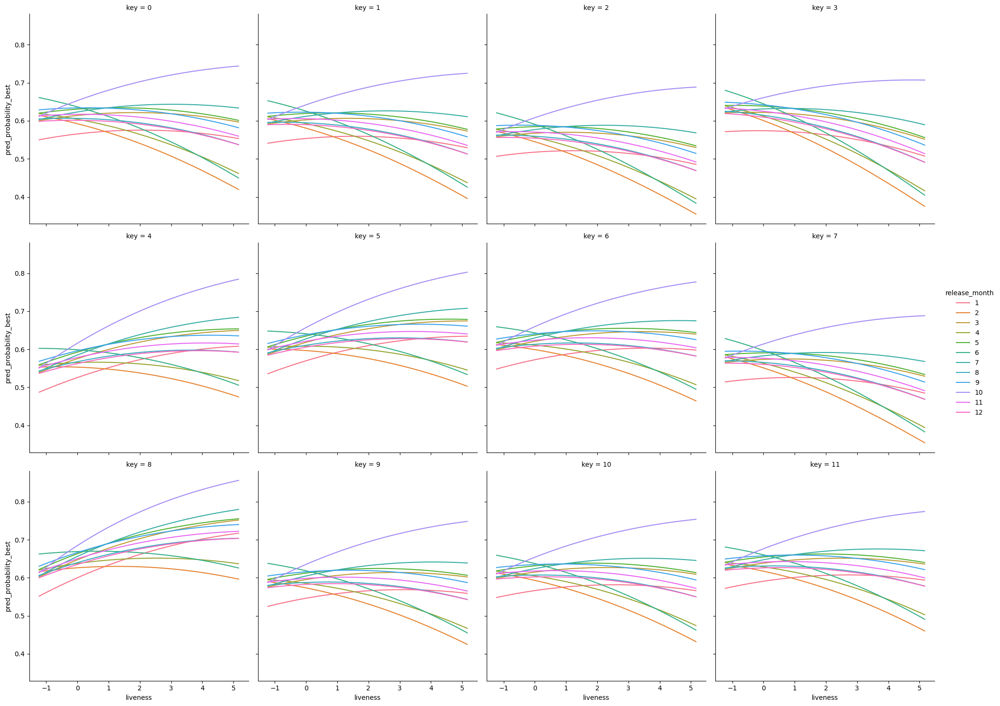

In [117]:
## viz the best model

sns.relplot(data=viz_grid, x='liveness', y='pred_probability_best', hue='release_month', col='key',
           kind='line', estimator=None, units='release_month',
           col_wrap=4)

plt.show()

The relationship between liveness and predicted popularity in this model is very different. For some release_month values, the slope is positve and some is negative. When you look from key to key, you can also see how the slopes can change from negative to positive as with songs released in June/July where in key 3 the slope is negative, while in key 5 it is positive.

**Discuss the confidence intervals, prediction intervals, or trends in uncertainty across model predictions. Explains what these indicate about the reliability of the model’s predictions and how this uncertainty might impact decision-making or further analysis.**

In [118]:
def fit_and_assess_pred(mod_name, a_formula, train_data, threshold):
    a_mod = smf.logit(formula=a_formula, data=train_data).fit()
    train_copy = train_data.copy()
    train_copy['pred_probability'] = a_mod.predict(train_data)
    train_copy['pred_class'] = np.where(train_copy.pred_probability > threshold, 1, 0)
    TN, FP, FN, TP = confusion_matrix(train_copy.binary_outcome.to_numpy(), train_copy.pred_class.to_numpy()).ravel()
    Accuracy = (TN + TP) / (TN + TP + FP + FN)
    Sensitivity = (TP) / (TP + FN)
    Specificity = (TN) / (TN + FP)
    FPR = 1 - Specificity
    res_dict = {'model_name': mod_name,
               'model formula' : a_formula,
               'num_coefs': len(a_mod.params),
                'True Negative':TN,
               'False Positive':FP,
               'False Negative':FN,
               'True Positive':TP,
               'threshold': threshold,
               'Accuracy': Accuracy,
               'Sensitivity': Sensitivity,
               'Specificity': Specificity,
               'FPR': FPR}
    return pd.DataFrame(res_dict, index=[0])

In [119]:
linear_pred_stats = fit_and_assess_pred('linear', linear_additive_formula, dfa, 0.5)
best_pred_stats = fit_and_assess_pred('best', best_training_formula, dfa, 0.5)

pd.concat([linear_pred_stats, best_pred_stats], ignore_index=False)

Optimization terminated successfully.
         Current function value: 0.655160
         Iterations 5
Optimization terminated successfully.
         Current function value: 0.604431
         Iterations 7


,model_name,model formula,num_coefs,True Negative,False Positive,False Negative,True Positive,threshold,Accuracy,Sensitivity,Specificity,FPR
0,linear,binary_outcome ~ bin_year + playlist_genre + k...,40,6586,6838,4121,10811,0.5,0.613521,0.724016,0.490614,0.509386
0,best,binary_outcome ~ (bin_year + playlist_genre + ...,1690,7843,5581,3946,10986,0.5,0.664022,0.735735,0.584252,0.415748


The Accuracy for both of these models is somewhat similar, differing by 5%, but the False Positive Rates are vastly different with a delta of about 9%. The uncertainty of the Linear model is higher, I think, becuase it does not consider the possible interactions of the variables, leading to a higher false positive rate. 

The higher FPR in the Linear model would cause me to veer toward the model that performed the best on the training data - which also already has a higher Accuracy!

## F. Models: Performance and Validation (25 points)

* You will use 3 of the formulations you considered in Part D.
  * You must select the formulation that was the best model on the training set.
  * You must choose 2 additional formulations. One should be simple (few features), and one should be of medium to high complexity.

In [120]:
formula_best_train = 'binary_outcome ~ (bin_year + playlist_genre + key + Mode + release_month) * ((danceability + energy + loudness + speechiness + acousticness + instrumentalness + liveness + valence + tempo + duration_ms)**2) + np.power(danceability, 2) + np.power(energy, 2) + np.power(loudness, 2) + np.power(speechiness, 2) + np.power(acousticness, 2) + np.power(instrumentalness, 2) + np.power(liveness, 2) + np.power(valence, 2) + np.power(tempo, 2) + np.power(duration_ms, 2)'
formula_simple = 'binary_outcome ~ danceability + energy + loudness + speechiness + acousticness + instrumentalness + liveness + valence + tempo + duration_ms'
formula_complex = 'binary_outcome ~ (bin_year + playlist_genre + key + Mode + release_month) * (np.power(danceability, 2) + np.power(energy, 2) + np.power(loudness, 2) + np.power(speechiness, 2) + np.power(acousticness, 2) + np.power(instrumentalness, 2) + np.power(liveness, 2) + np.power(valence, 2) + np.power(tempo, 2) + np.power(duration_ms, 2))'

formula_list_2 = [formula_best_train, formula_simple, formula_complex]

In [121]:
## import modules and functions
from sklearn.model_selection import StratifiedKFold
from sklearn.linear_model import LogisticRegression
from patsy import dmatrices
from sklearn.model_selection import cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import PolynomialFeatures
from sklearn.decomposition import PCA

In [122]:
## go back to the original data set and select data
df_pipeline = df_copy.copy()

df_pipeline.drop(columns = ['track_id',
                                     'track_name',
                                     'track_artist',
                                     'track_popularity',
                                     'track_album_id',
                                     'track_album_name',
                                     'track_album_release_date',
                                     'playlist_name',
                                     'playlist_id',
                                     'playlist_subgenre',
                                     'track_album_release_date_dt',
                                     'release_year'], inplace=True)

## modify release_month, playlist_genre, key, bin_year, and mode to categoricals
df_pipeline['release_month'] = df_pipeline.release_month.astype('category')
df_pipeline['playlist_genre'] = df_pipeline.playlist_genre.astype('category')
df_pipeline['mode'] = df_pipeline['mode'].astype('category')
df_pipeline['key'] = df_pipeline.key.astype('category')
df_pipeline['bin_year'] = df_pipeline.bin_year.astype('category')

## change the name of the mode column
df_pipeline.rename(columns={'mode':'Mode'}, inplace=True)
df_pipeline['Mode'] = df_pipeline.Mode.astype('str')

* You must use CROSS-VALIDATION to evaluate the performance for each of the 3 models. Using “regular” K-fold OR stratified K-fold depends on whether you are working on a REGRESSION or CLASSIFICATION problem. You may choose 5-fold, 10-fold, or repeated cross-validation. You must identify an appropriate performance metric to focus on based on the output data type.

In [123]:
## select data
xinputs = df_pipeline.select_dtypes('number').copy()
youtput = df_pipeline.loc[:, ['binary_outcome']].copy()

## convert to numpy
X_train = xinputs.to_numpy()
y_train = youtput.to_numpy().ravel()

## initialize elastic net model
enet_to_fit = LogisticRegression(penalty='elasticnet', solver='saga', random_state=2100, max_iter=25001, fit_intercept=True)

## specify pipeline steps
enet_wflow = Pipeline(steps = [('std_inputs', StandardScaler()),
                              ('enet', enet_to_fit)])

## initialize kfold
kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=2100)

## define tuning parameters
enet_grid = {'enet__C': np.exp(np.linspace(-10, 10, num=15)), 
             'enet__l1_ratio':np.linspace(0, 1, num=5)}

## initialize the grid search
enet_search = GridSearchCV(enet_wflow, param_grid=enet_grid, cv=kf)

In [124]:
## run the grid search to tune the model
enet_search_results = enet_search.fit( X_train, y_train )

In [125]:
enet_search_results.best_params_

{'enet__C': 0.0032985057559390915, 'enet__l1_ratio': 0.0}

It looks like since the `l1_ratio == 0`, Ridge penalty would be best.

In [126]:
## initialize the model
sk_min_loss = LogisticRegression(penalty='l2', C=0.0032985057559390915, solver='lbfgs', fit_intercept=False, max_iter=25001)

In [127]:
## formula copied from 'week_13_cv_sklearn_cross_val_score'

def logistic_cross_val_score(mod_name, a_formula, init_mod, data_df, cv):
    # create the feature and outuput arrays using the formula
    y, X = dmatrices( a_formula, data = data_df)

    # train and test within each fold - return test scores
    test_res = cross_val_score( init_mod, X, y.ravel(), cv=cv )

    # book keeping
    res_df = pd.DataFrame({'Accuracy':test_res})
    res_df['fold_id'] = res_df.index + 1
    res_df['model_name'] = mod_name
    res_df['mdodel_formula'] = a_formula
    res_df['num_coefs'] = X.shape[1]

    return res_df

In [128]:
## run the above function for each model
best_train_score_df = logistic_cross_val_score('best_train', formula_list_2[0], init_mod=sk_min_loss, data_df=dfa, cv=kf)
simple_score_df = logistic_cross_val_score('simple', formula_list_2[1], init_mod=sk_min_loss, data_df=dfa, cv=kf)
complex_score_df = logistic_cross_val_score('complex', formula_list_2[2], init_mod=sk_min_loss, data_df=dfa, cv=kf)

In [129]:
## combine into one data frame

cv_score_df = pd.concat([best_train_score_df, simple_score_df, complex_score_df], ignore_index=True)

cv_score_df

,Accuracy,fold_id,model_name,mdodel_formula,num_coefs
0,0.623061,1,best_train,binary_outcome ~ (bin_year + playlist_genre + ...,1690
1,0.615235,2,best_train,binary_outcome ~ (bin_year + playlist_genre + ...,1690
2,0.624581,3,best_train,binary_outcome ~ (bin_year + playlist_genre + ...,1690
3,0.619467,4,best_train,binary_outcome ~ (bin_year + playlist_genre + ...,1690
4,0.612414,5,best_train,binary_outcome ~ (bin_year + playlist_genre + ...,1690
5,0.591855,1,simple,binary_outcome ~ danceability + energy + loudn...,11
6,0.582261,2,simple,binary_outcome ~ danceability + energy + loudn...,11
7,0.587551,3,simple,binary_outcome ~ danceability + energy + loudn...,11
8,0.596191,4,simple,binary_outcome ~ danceability + energy + loudn...,11
9,0.580145,5,simple,binary_outcome ~ danceability + energy + loudn...,11


**Visualize the CROSS-VALIDATION results by showing the AVERAGE CROSS-VALIDATION performance metric with the 95% confidence interval for each model.**

/opt/anaconda3/envs/cmpinf2100/lib/python3.8/site-packages/seaborn/axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


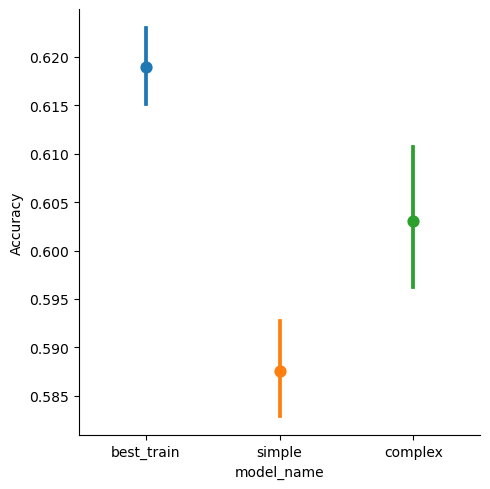

In [130]:
sns.catplot(data=cv_score_df, x='model_name', y='Accuracy',
           kind='point', linestyle='none', errorbar=('ci', 95), hue='model_name')

plt.show()

**Which model is the BEST according to CROSS-VALIDATION?**
* The best model according to 5-fold CV is the model that performed the best on the training data.

**Is this model DIFFERENT from the model identified as the BEST according to the training set?**
* This model is not different from the one that did the best on the training set.

**How many regression coefficients are associated with the best model?**
* There were 1690 coefficients associated with the best model.